### check results

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def load_decoder_results(subject, date, area, target, alignment, train_mod, train_coh, 
                         test_mod=None, test_coh=None, regress_type='noregress'):
    """Load saved decoder results."""
    test_mod = test_mod or train_mod
    test_coh = test_coh or train_coh
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}')
    filename = (f"{subject}_{date}_{area}_{target}_{alignment}_"
                f"train_mod{train_mod}_coh{train_coh}_"
                f"test_mod{test_mod}_coh{test_coh}_results.npy")
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def extract_dv_trials(results, test_set='test_cv', target='choice'):
    """Extract trial-level DVs (not averaged) - returns dict of {time: [list of DVs]}."""
    trial_results = results['trial_results']
    dv_by_time = {}
    
    for r in trial_results:
        t = r['time']
        if t not in dv_by_time:
            dv_by_time[t] = []
        
        if test_set not in r:
            continue
            
        y_proba = r[test_set].get('y_proba', np.array([]))
        behavior = r[test_set].get('behavior', {})
        
        if len(y_proba) == 0 or len(behavior) == 0:
            continue
        
        # Compute raw log-odds
        y_proba_clipped = np.clip(y_proba, 1e-10, 1 - 1e-10)
        raw_logodds = np.log(y_proba_clipped / (1 - y_proba_clipped))
        
        # Get the TRUE label for each trial
        if target == 'choice':
            label = np.array(behavior.get('choice', []))
            label = (label - 1).astype(int) if len(label) > 0 and np.max(label) > 1 else label
        elif target == 'PDW':
            label = np.array(behavior.get('PDW', [])).astype(int) if 'PDW' in behavior else np.array([])
        else:  # stimulus
            headingInd = np.array(behavior.get('headingInd', []))
            if test_set == 'test_zero':
                label = np.ones(len(raw_logodds))
            else:
                label = (headingInd > 4).astype(int)
        
        if len(label) != len(raw_logodds):
            continue
        
        # Flip DV for class 0 trials
        flipped_logodds = raw_logodds.copy()
        class0_mask = label == 0
        flipped_logodds[class0_mask] = -flipped_logodds[class0_mask]
        
        dv_by_time[t].extend(flipped_logodds.tolist())
    
    return dv_by_time

def extract_dv_trials_split(results, test_set='test_cv', split_by='choice'):
    """Extract trial-level DVs, split by another variable."""
    trial_results = results['trial_results']
    dv_by_time = {}
    rng = np.random.RandomState(42)
    
    for r in trial_results:
        t = r['time']
        if t not in dv_by_time:
            dv_by_time[t] = []
        
        if test_set not in r:
            continue
            
        y_proba = r[test_set].get('y_proba', np.array([]))
        behavior = r[test_set].get('behavior', {})
        
        if len(y_proba) == 0 or len(behavior) == 0:
            continue
        
        y_proba_clipped = np.clip(y_proba, 1e-10, 1 - 1e-10)
        raw_logodds = np.log(y_proba_clipped / (1 - y_proba_clipped))
        
        if split_by == 'choice':
            split_label = np.array(behavior.get('choice', []))
            split_label = (split_label - 1).astype(int) if len(split_label) > 0 and np.max(split_label) > 1 else split_label
        elif split_by == 'pdw':
            split_label = np.array(behavior.get('PDW', [])).astype(int) if 'PDW' in behavior else np.array([])
        else:  # random
            split_label = rng.randint(0, 2, size=len(raw_logodds))
        
        if len(split_label) != len(raw_logodds):
            continue
        
        flipped_logodds = raw_logodds.copy()
        class0_mask = split_label == 0
        flipped_logodds[class0_mask] = -flipped_logodds[class0_mask]
        
        dv_by_time[t].extend(flipped_logodds.tolist())
    
    return dv_by_time

def aggregate_dv_by_time(dv_by_time):
    """Convert dict of {time: [DVs]} to arrays of time, mean, sem."""
    time_points, means, sems = [], [], []
    for t in sorted(dv_by_time.keys()):
        if dv_by_time[t]:
            vals = np.array(dv_by_time[t])
            time_points.append(t)
            means.append(np.mean(vals))
            sems.append(np.std(vals) / np.sqrt(len(vals)))
    return np.array(time_points), np.array(means), np.array(sems)

def pool_dv_across_sessions(subject, dates, area, target, alignment, mod, coh, 
                            test_set='test_cv', regress_type='noregress', split_by=None):
    """Pool DVs across multiple sessions."""
    pooled_dv_by_time = {}
    
    for date in dates:
        results = load_decoder_results(subject, date, area, target, alignment, mod, coh, regress_type=regress_type)
        if results is None:
            continue
        
        if split_by is not None:
            dv_by_time = extract_dv_trials_split(results, test_set=test_set, split_by=split_by)
        else:
            dv_by_time = extract_dv_trials(results, test_set=test_set, target=target)
        
        # Pool into combined dict
        for t, dvs in dv_by_time.items():
            if t not in pooled_dv_by_time:
                pooled_dv_by_time[t] = []
            pooled_dv_by_time[t].extend(dvs)
    
    return pooled_dv_by_time

def plot_decoder_dv_pooled_sessions(subject, dates, area, time_axes, target, test_set, regress_type='noregress'):
    """Plot pooled DV timecourse across all sessions."""
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    mod_colors = {1: 'black', 2: 'red', 3: 'blue'}
    mod_labels = {1: 'Vestibular', 2: 'Visual', 3: 'Combined'}
    ylims = {'choice': (-0.2, 1), 'PDW': (-0.2, 2), 'stimulus': (-0.2, 1)}
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    for col, alignment in enumerate(alignments):
        ax = axes[col]
        time_axis = np.array(time_axes.get(alignment, []))

        for mod in [1, 2, 3]:
            for coh in [1, 2]:
                if mod == 1 and coh == 2:
                    continue
                
                # Pool across all sessions
                pooled_dv = pool_dv_across_sessions(
                    subject, dates, area, target, alignment, mod, coh,
                    test_set=test_set, regress_type=regress_type
                )
                
                if not pooled_dv:
                    continue
                
                time_points, means, sems = aggregate_dv_by_time(pooled_dv)
                
                if len(time_points) == 0:
                    continue
                
                # Convert time indices to actual time values
                if len(time_axis) > 0:
                    valid_mask = time_points < len(time_axis)
                    time_values = time_axis[time_points[valid_mask].astype(int)]
                    means, sems = means[valid_mask], sems[valid_mask]
                else:
                    time_values = time_points

                linestyle = '-' if (mod == 1 or coh == 2) else '--'
                ax.plot(time_values, means, color=mod_colors[mod], linestyle=linestyle, linewidth=1.5)
                ax.fill_between(time_values, means - sems, means + sems, color=mod_colors[mod], alpha=0.15)

        ax.axhline(0, color='gray', linestyle='--', linewidth=0.5)
        ax.axvline(0, color='green', linestyle='-', linewidth=1.5, alpha=0.7)
        ax.set_xlabel('Time (s)')
        ax.set_ylabel('Pooled DV (Log-Odds)')
        ax.set_ylim(ylims[target])
        ax.set_title(alignment, fontsize=12, fontweight='bold')
        
        for mod_id in [1, 2, 3]:
            ax.plot([], [], color=mod_colors[mod_id], linewidth=2, label=mod_labels[mod_id])
        ax.legend(loc='best', fontsize=8)

    test_set_names = {'test_cv': 'CV Held-Out', 'test_zero': 'Zero Heading', 'test_large': 'Large Headings'}
    n_sessions = len(dates)
    plt.suptitle(f'{subject} {area} - {target.upper()} Decoder (Pooled, N={n_sessions} sessions)\n{test_set_names.get(test_set, test_set)} ({regress_type})', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'DV_{target}_{test_set}_{subject}_{area}_{regress_type}_pooled_sessions.png', dpi=150, bbox_inches='tight')
    plt.show()

def plot_stimulus_zero_heading_splits_sessions(subject, dates, area, time_axes, regress_type='noregress'):
    """Plot stimulus decoder on zero heading with 3 split types, pooled across sessions."""
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    split_options = ['choice', 'pdw', 'random']
    row_labels = {'choice': 'Split by Choice', 'pdw': 'Split by PDW', 'random': 'Split by Random'}
    mod_colors = {1: 'black', 2: 'red', 3: 'blue'}
    mod_labels = {1: 'Vestibular', 2: 'Visual', 3: 'Combined'}
    
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))

    for row, split_by in enumerate(split_options):
        for col, alignment in enumerate(alignments):
            ax = axes[row, col]
            time_axis = np.array(time_axes.get(alignment, []))

            for mod in [1, 2, 3]:
                for coh in [1, 2]:
                    if mod == 1 and coh == 2:
                        continue
                    
                    # Pool across all sessions
                    pooled_dv = pool_dv_across_sessions(
                        subject, dates, area, 'stimulus', alignment, mod, coh,
                        test_set='test_zero', regress_type=regress_type, split_by=split_by
                    )
                    
                    if not pooled_dv:
                        continue
                    
                    time_points, means, sems = aggregate_dv_by_time(pooled_dv)
                    
                    if len(time_points) == 0:
                        continue
                    
                    if len(time_axis) > 0:
                        valid_mask = time_points < len(time_axis)
                        time_values = time_axis[time_points[valid_mask].astype(int)]
                        means, sems = means[valid_mask], sems[valid_mask]
                    else:
                        time_values = time_points

                    linestyle = '-' if (mod == 1 or coh == 2) else '--'
                    ax.plot(time_values, means, color=mod_colors[mod], linestyle=linestyle, linewidth=1.5)
                    ax.fill_between(time_values, means - sems, means + sems, color=mod_colors[mod], alpha=0.15)

            ax.axhline(0, color='gray', linestyle='--', linewidth=0.5)
            ax.axvline(0, color='green', linestyle='-', linewidth=1.5, alpha=0.7)
            ax.set_xlabel('Time (s)')
            ax.set_ylim((-0.5, 2))
            
            if row == 0:
                ax.set_title(alignment, fontsize=12, fontweight='bold')
            if col == 0:
                ax.set_ylabel(f'{row_labels[split_by]}\nPooled DV')
            
            if row == 0 and col == 2:
                for mod_id in [1, 2, 3]:
                    ax.plot([], [], color=mod_colors[mod_id], linewidth=2, label=mod_labels[mod_id])
                ax.legend(loc='best', fontsize=8)

    n_sessions = len(dates)
    plt.suptitle(f'{subject} {area} - STIMULUS Decoder on Zero Heading (N={n_sessions} sessions)\nPooled by Choice/PDW/Random', 
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'DV_stimulus_zero_splits_{subject}_{area}_{regress_type}_pooled_sessions.png', dpi=150, bbox_inches='tight')
    plt.show()

def load_time_axes_only(subject, date):
    """Load time axes for a given subject and date."""
    import sys
    sys.path.append(r'D:\Neural-Pipeline\source')
    from analysis_utils.NeuralDataLoader import NeuralDataLoader, Dots3DMPConfig
    loader = NeuralDataLoader()
    loader.load_session(subject, date)
    return Dots3DMPConfig(subject).get_time_axes('dots3DMP')

# =============================================================================
# MAIN
# =============================================================================
if __name__ == "__main__":
    subject = "zarya"
    
    
    # Use first session for time axes (assuming all sessions have same time axes)
    dates = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    time_axes = load_time_axes_only(subject, "20250602")
    regress_type = 'noregress' # 'partialregress', 'noregress'

    for area in ['MST', 'VPS']:
        print(f"\n{'='*60}\nAREA: {area}\n{'='*60}")

        # PDW decoder
        for test_set in ['test_cv', 'test_zero', 'test_large']:
            print(f"  PDW - {test_set}...")
            plot_decoder_dv_pooled_sessions(subject, dates, area, time_axes, target='PDW', test_set=test_set, regress_type=regress_type)
        
        # Choice decoder
        for test_set in ['test_cv', 'test_zero', 'test_large']:
            print(f"  Choice - {test_set}...")
            plot_decoder_dv_pooled_sessions(subject, dates, area, time_axes, target='choice', test_set=test_set, regress_type=regress_type)
        
        
        # # Stimulus decoder (not zero heading)
        for test_set in ['test_cv', 'test_large']:
            print(f"  Stimulus - {test_set}...")
            plot_decoder_dv_pooled_sessions(subject, dates, area, time_axes, target='stimulus', test_set=test_set, regress_type=regress_type)
        
        # # Stimulus decoder on zero heading with splits
        print(f"  Stimulus - zero heading splits...")
        plot_stimulus_zero_heading_splits_sessions(subject, dates, area, time_axes, regress_type=regress_type)

    print("\nDone!")

### time differnce between areas

Loaded dots3DMP data: zarya20250602dots3DMP_processed.npz
Loaded dots3DMPtuning data: zarya20250602dots3DMPtuning_processed.npz
Loaded dots3DMP configuration for subject: zarya

Generating comparison plots


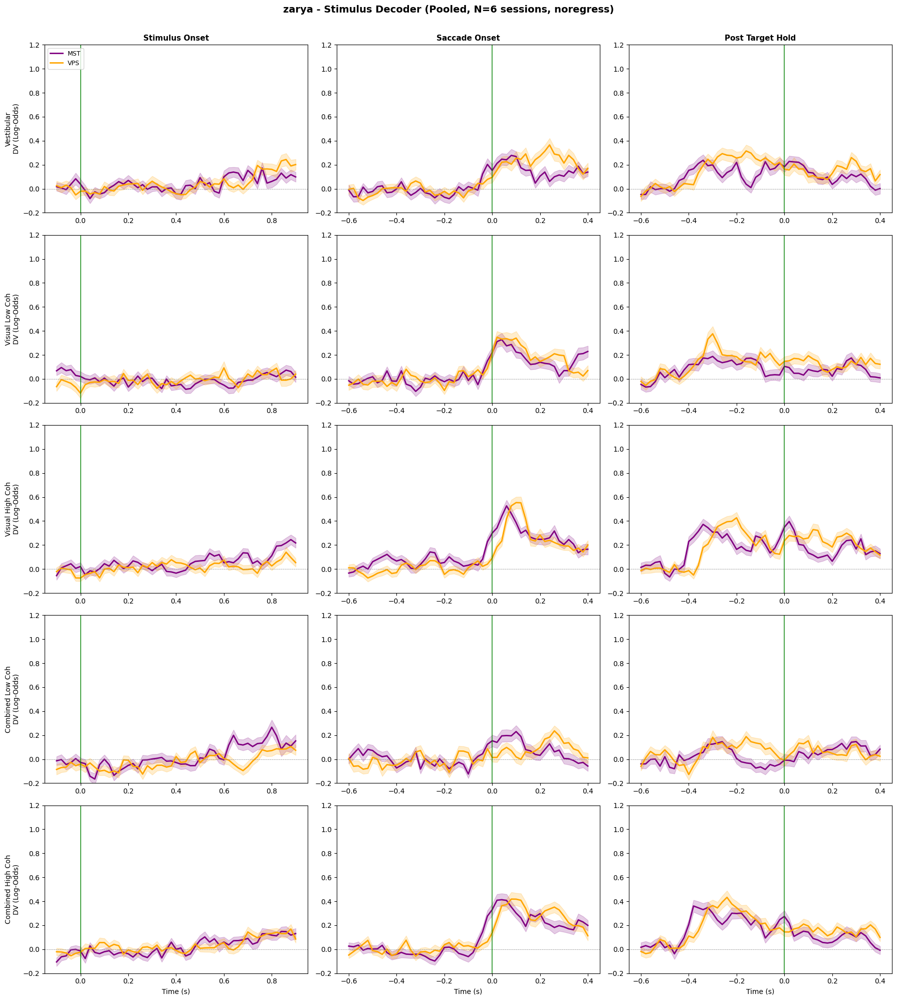

Saved figure for Stimulus


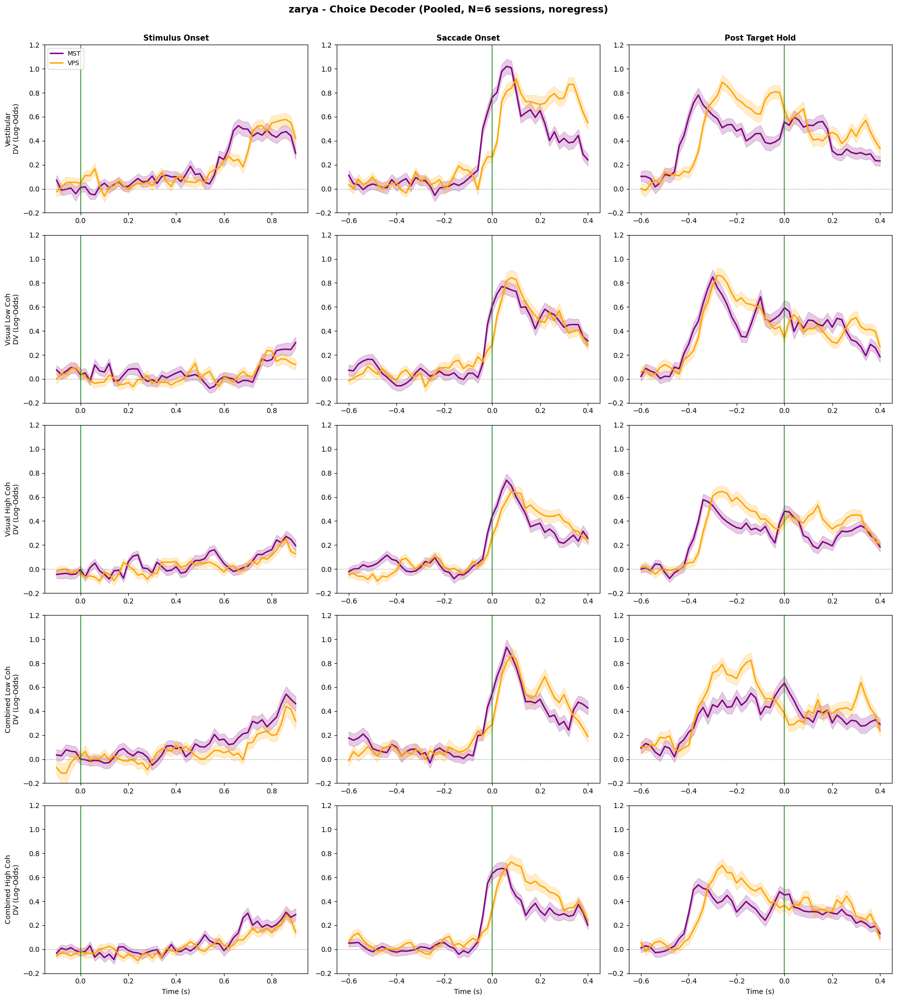

Saved figure for Choice


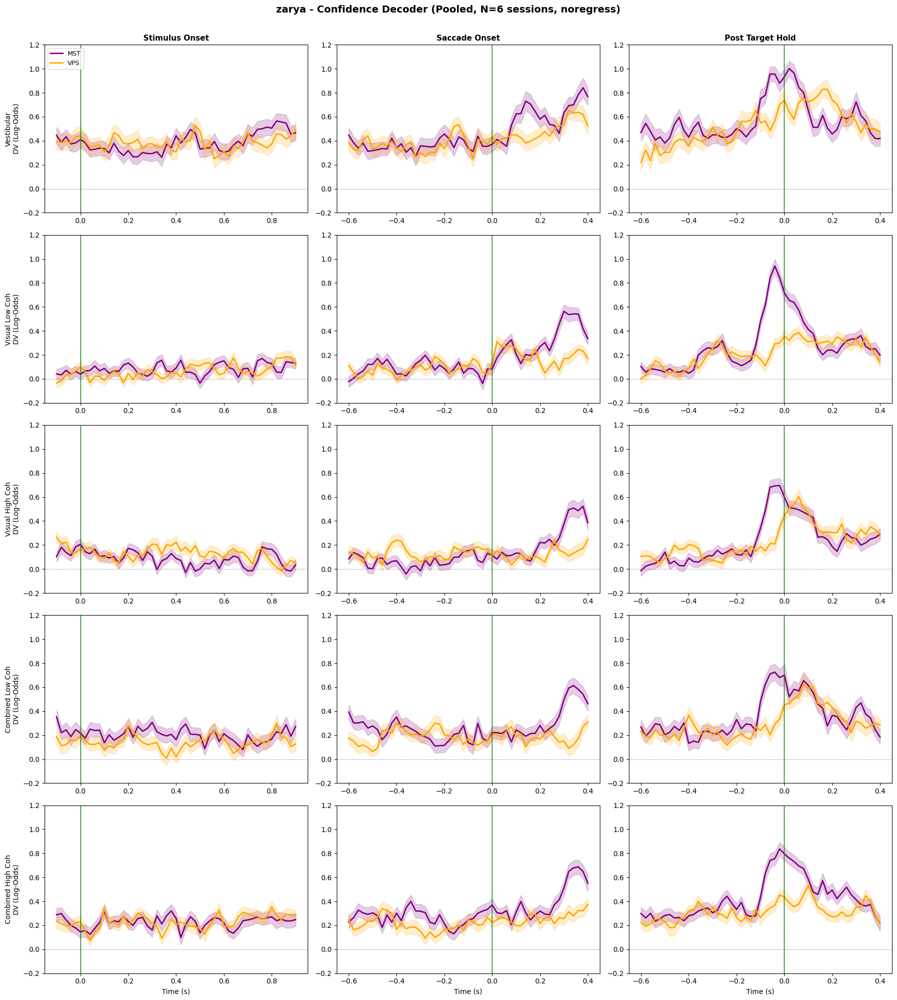

Saved figure for Confidence

Done!


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def load_decoder_results(subject, date, area, target, alignment, train_mod, train_coh, 
                         test_mod=None, test_coh=None, regress_type='noregress'):
    """Load saved decoder results."""
    test_mod = test_mod or train_mod
    test_coh = test_coh or train_coh
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}')
    filename = (f"{subject}_{date}_{area}_{target}_{alignment}_"
                f"train_mod{train_mod}_coh{train_coh}_"
                f"test_mod{test_mod}_coh{test_coh}_results.npy")
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def extract_dv_trials(results, test_set='test_cv', target='choice'):
    """Extract trial-level DVs (not averaged) - returns dict of {time: [list of DVs]}."""
    trial_results = results['trial_results']
    dv_by_time = {}
    
    for r in trial_results:
        t = r['time']
        if t not in dv_by_time:
            dv_by_time[t] = []
        
        if test_set not in r:
            continue
            
        y_proba = r[test_set].get('y_proba', np.array([]))
        behavior = r[test_set].get('behavior', {})
        
        if len(y_proba) == 0 or len(behavior) == 0:
            continue
        
        # Compute raw log-odds
        y_proba_clipped = np.clip(y_proba, 1e-10, 1 - 1e-10)
        raw_logodds = np.log(y_proba_clipped / (1 - y_proba_clipped))
        
        # Get the TRUE label for each trial
        if target == 'choice':
            label = np.array(behavior.get('choice', []))
            label = (label - 1).astype(int) if len(label) > 0 and np.max(label) > 1 else label
        elif target == 'PDW':
            label = np.array(behavior.get('PDW', [])).astype(int) if 'PDW' in behavior else np.array([])
        else:  # stimulus
            headingInd = np.array(behavior.get('headingInd', []))
            if test_set == 'test_zero':
                label = np.ones(len(raw_logodds))
            else:
                label = (headingInd > 4).astype(int)
        
        if len(label) != len(raw_logodds):
            continue
        
        # Flip DV for class 0 trials
        flipped_logodds = raw_logodds.copy()
        class0_mask = label == 0
        flipped_logodds[class0_mask] = -flipped_logodds[class0_mask]
        
        dv_by_time[t].extend(flipped_logodds.tolist())
    
    return dv_by_time

def aggregate_dv_by_time(dv_by_time):
    """Convert dict of {time: [DVs]} to arrays of time, mean, sem."""
    time_points, means, sems = [], [], []
    for t in sorted(dv_by_time.keys()):
        if dv_by_time[t]:
            vals = np.array(dv_by_time[t])
            time_points.append(t)
            means.append(np.mean(vals))
            sems.append(np.std(vals) / np.sqrt(len(vals)))
    return np.array(time_points), np.array(means), np.array(sems)

def pool_dv_across_sessions(subject, dates, area, target, alignment, mod, coh, 
                            test_set='test_cv', regress_type='noregress'):
    """Pool DVs across multiple sessions."""
    pooled_dv_by_time = {}
    
    for date in dates:
        results = load_decoder_results(subject, date, area, target, alignment, mod, coh, regress_type=regress_type)
        if results is None:
            continue
        
        dv_by_time = extract_dv_trials(results, test_set=test_set, target=target)
        
        # Pool into combined dict
        for t, dvs in dv_by_time.items():
            if t not in pooled_dv_by_time:
                pooled_dv_by_time[t] = []
            pooled_dv_by_time[t].extend(dvs)
    
    return pooled_dv_by_time

def plot_decoder_dv_by_target_aligned(subject, dates, time_axes, targets, alignments, regress_type='noregress'):
    """
    Plot three figures (stimulus, choice, confidence).
    Each figure: rows = modality/coherence conditions (top to bottom), columns = alignments (left to right)
    Each subplot: MST (purple) and VPS (orange) lines
    """
    area_colors = {'MST': 'purple', 'VPS': 'orange'}
    mod_labels = {
        (1, 1): 'Vestibular',
        (2, 1): 'Visual Low Coh',
        (2, 2): 'Visual High Coh',
        (3, 1): 'Combined Low Coh',
        (3, 2): 'Combined High Coh'
    }
    alignment_labels = {
        'stimOn': 'Stimulus Onset',
        'saccOnset': 'Saccade Onset',
        'postTargHold': 'Post Target Hold'
    }
    ylims = {'choice': (-0.2, 1.2), 'PDW': (-0.2, 1.2), 'stimulus': (-0.2, 1.2)}
    
    # Define conditions (mod, coh) - these will be rows
    conditions = [(1, 1), (2, 1), (2, 2), (3, 1), (3, 2)]
    
    for target in targets:
        n_rows = len(conditions)  # Each condition is a row
        n_cols = len(alignments)  # Each alignment is a column
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows))
        if n_rows == 1:
            axes = axes.reshape(1, -1)
        if n_cols == 1:
            axes = axes.reshape(-1, 1)
        
        for row_idx, (mod, coh) in enumerate(conditions):
            for col_idx, alignment in enumerate(alignments):
                ax = axes[row_idx, col_idx]
                time_axis = np.array(time_axes.get(alignment, []))
                
                # Plot both areas
                for area in ['MST', 'VPS']:
                    # Pool across all sessions
                    pooled_dv = pool_dv_across_sessions(
                        subject, dates, area, target, alignment, mod, coh,
                        test_set='test_cv', regress_type=regress_type
                    )
                    
                    if not pooled_dv:
                        continue
                    
                    time_points, means, sems = aggregate_dv_by_time(pooled_dv)
                    
                    if len(time_points) == 0:
                        continue
                    
                    # Convert time indices to actual time values
                    if len(time_axis) > 0:
                        valid_mask = time_points < len(time_axis)
                        time_values = time_axis[time_points[valid_mask].astype(int)]
                        means, sems = means[valid_mask], sems[valid_mask]
                    else:
                        time_values = time_points
                    
                    # Plot
                    ax.plot(time_values, means, color=area_colors[area], 
                           linewidth=2, label=area)
                    ax.fill_between(time_values, means - sems, means + sems, 
                                   color=area_colors[area], alpha=0.2)
                
                # Formatting
                ax.axhline(0, color='gray', linestyle='--', linewidth=0.5)
                ax.axvline(0, color='green', linestyle='-', linewidth=1.5, alpha=0.7)
                ax.set_ylim(ylims[target])
                
                # Labels
                if row_idx == n_rows - 1:
                    ax.set_xlabel('Time (s)', fontsize=10)
                if col_idx == 0:
                    ax.set_ylabel(f'{mod_labels[(mod, coh)]}\nDV (Log-Odds)', fontsize=10)
                
                # Title only for top row (alignment names)
                if row_idx == 0:
                    ax.set_title(alignment_labels[alignment], fontsize=11, fontweight='bold')
                
                # Legend only for first subplot
                if row_idx == 0 and col_idx == 0:
                    ax.legend(loc='upper left', fontsize=9)
        
        n_sessions = len(dates)
        target_name = 'Confidence' if target == 'PDW' else target.capitalize()
        plt.suptitle(f'{subject} - {target_name} Decoder (Pooled, N={n_sessions} sessions, {regress_type})', 
                     fontsize=14, fontweight='bold', y=0.995)
        
        # Adjust layout with extra top spacing for title
        plt.tight_layout(rect=[0, 0, 1, 0.99])
        plt.savefig(f'DV_{target}_comparison_{subject}_{regress_type}_pooled.png', 
                   dpi=150, bbox_inches='tight')
        plt.show()
        print(f"Saved figure for {target_name}")

def load_time_axes_only(subject, date):
    """Load time axes for a given subject and date."""
    import sys
    sys.path.append(r'D:\Neural-Pipeline\source')
    from analysis_utils.NeuralDataLoader import NeuralDataLoader, Dots3DMPConfig
    loader = NeuralDataLoader()
    loader.load_session(subject, date)
    return Dots3DMPConfig(subject).get_time_axes('dots3DMP')

# =============================================================================
# MAIN
# =============================================================================
if __name__ == "__main__":
    subject = "zarya"
    dates = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    
    # Use first session for time axes (assuming all sessions have same time axes)
    time_axes = load_time_axes_only(subject, "20250602")
    regress_type = 'noregress'  # 'partialregress', 'noregress'
    
    # Define alignments and targets
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    targets = ['stimulus', 'choice', 'PDW']
    
    print(f"\n{'='*60}\nGenerating comparison plots\n{'='*60}")
    
    # Generate all three figures
    plot_decoder_dv_by_target_aligned(
        subject, dates, time_axes, targets, alignments, regress_type=regress_type
    )
    
    print("\nDone!")

### stimulus / choice DV by PDW / correctness


AREA: MST

--- CHOICE DECODER (Small Headings) ---
Saved: DV_choice_four_categories_subsampled_zarya_MST_noregress.png


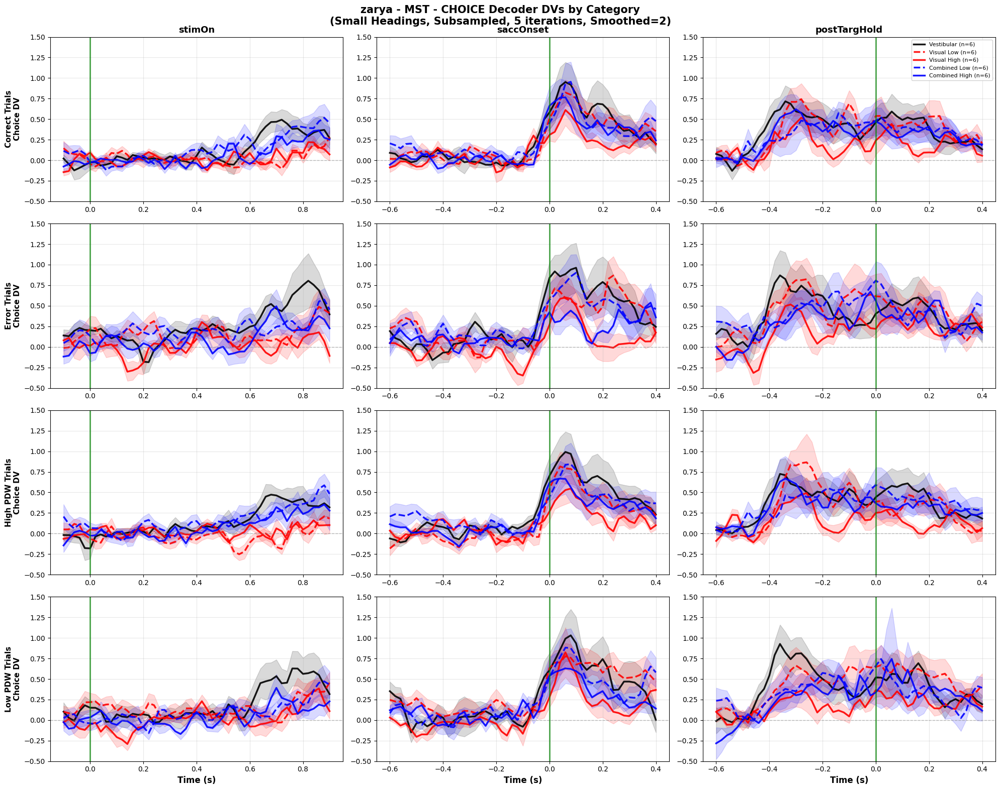


--- STIMULUS DECODER (Small Headings) ---
Saved: DV_stimulus_four_categories_subsampled_zarya_MST_noregress.png


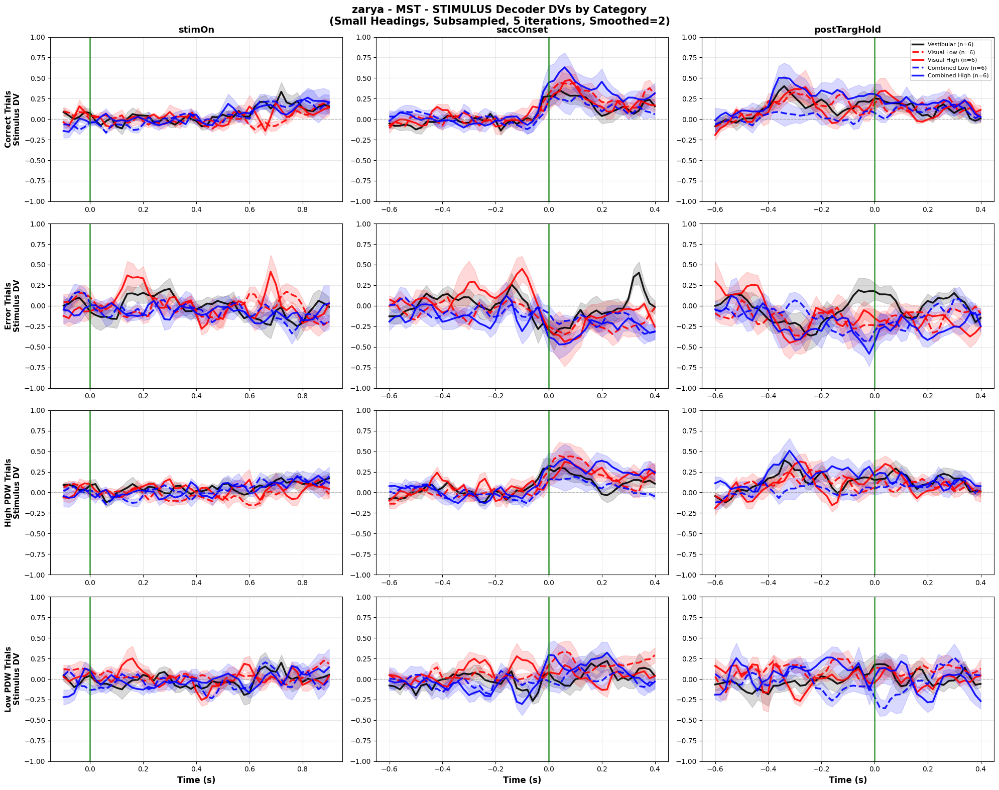


--- CHOICE DECODER (Zero Heading) ---
Saved: DV_choice_zero_heading_subsampled_zarya_MST_noregress.png


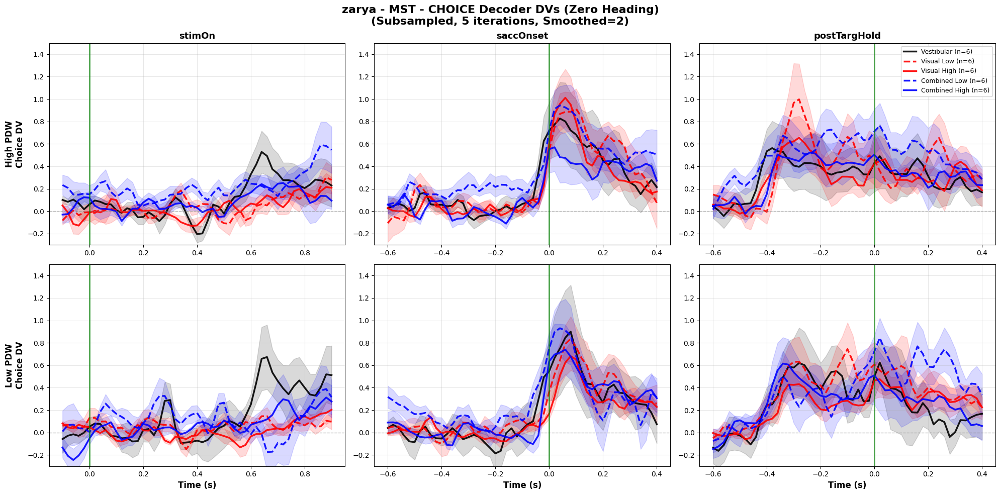


AREA: VPS

--- CHOICE DECODER (Small Headings) ---
Saved: DV_choice_four_categories_subsampled_zarya_VPS_noregress.png


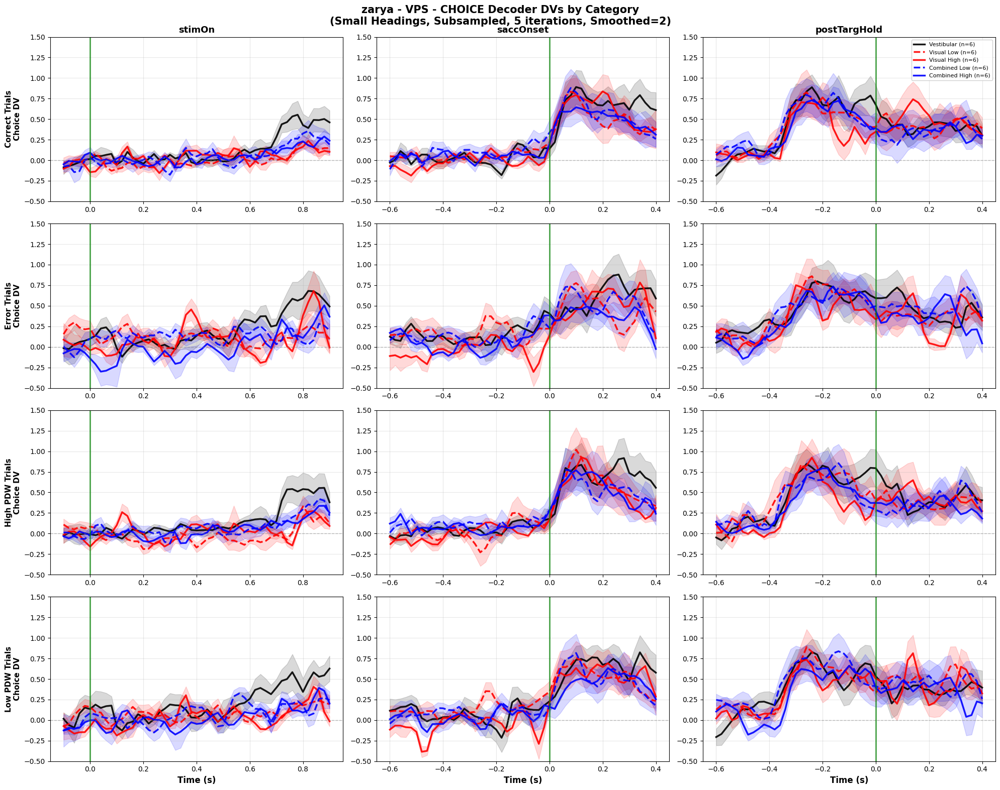


--- STIMULUS DECODER (Small Headings) ---
Saved: DV_stimulus_four_categories_subsampled_zarya_VPS_noregress.png


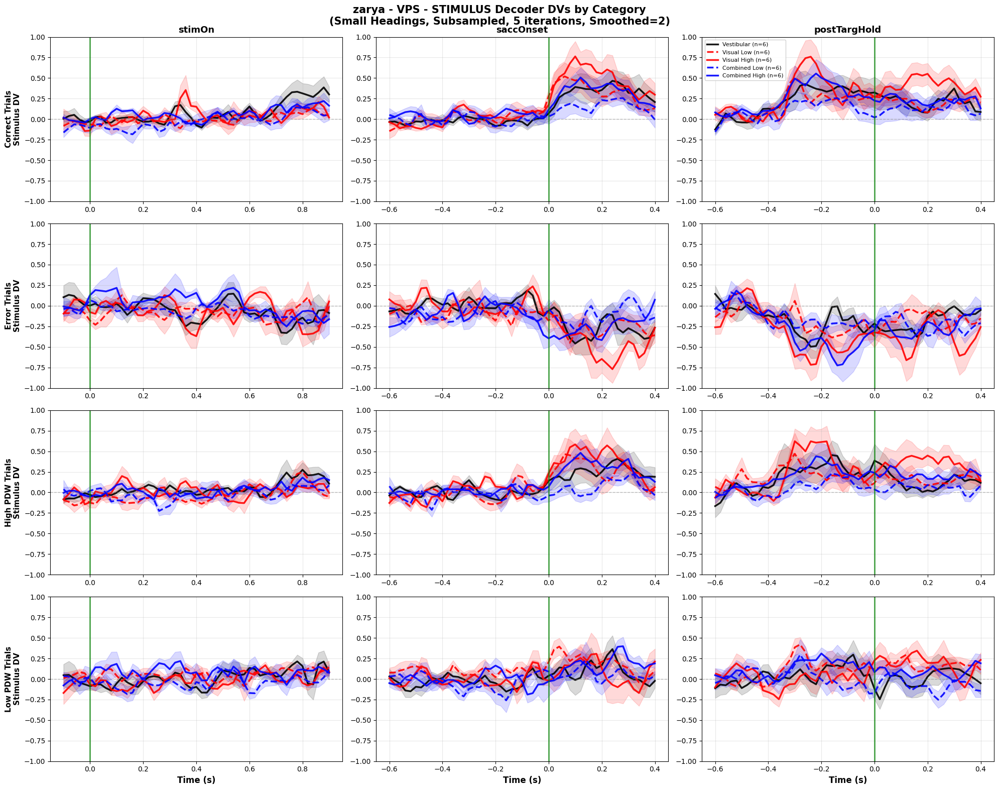


--- CHOICE DECODER (Zero Heading) ---
Saved: DV_choice_zero_heading_subsampled_zarya_VPS_noregress.png


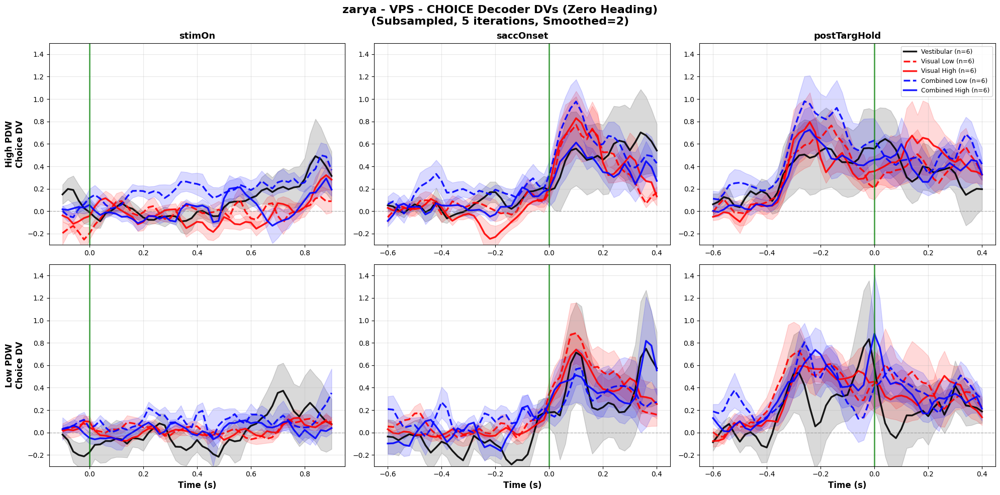


All DV plots completed!


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import uniform_filter1d

def load_decoder_results(subject, date, area, target, alignment, train_mod, train_coh, 
                         test_mod=None, test_coh=None, regress_type='noregress'):
    """Load saved decoder results."""
    test_mod = test_mod or train_mod
    test_coh = test_coh or train_coh
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}')
    filename = (f"{subject}_{date}_{area}_{target}_{alignment}_"
                f"train_mod{train_mod}_coh{train_coh}_"
                f"test_mod{test_mod}_coh{test_coh}_results.npy")
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def get_available_sessions(subject, area, target, alignment, mod, coh, regress_type='noregress'):
    """Find all available sessions."""
    all_sessions = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    available = []
    
    for date in all_sessions:
        results = load_decoder_results(subject, date, area, target, alignment,
                                      train_mod=mod, train_coh=coh, regress_type=regress_type)
        if results is not None:
            trial_results = results.get('trial_results', [])
            if len(trial_results) > 0:
                available.append(date)
    
    return available

def extract_dv_by_categories(subject, sessions, area, target, alignment, mod, coh, 
                             regress_type='noregress', small_headings=[2, 3, 5, 6],
                             smooth_window=1, n_subsample_iterations=100):
    """
    Extract DVs for 4 independent categories with subsampling:
    1. Correct trials (all PDW)
    2. Error trials (all PDW)
    3. High PDW trials (all accuracy)
    4. Low PDW trials (all accuracy)
    
    Uses subsampling to equalize trial counts for fair comparison.
    """
    
    all_sessions_dv = {
        'correct': [],
        'error': [],
        'high_pdw': [],
        'low_pdw': [],
        'time_axis': None
    }
    
    for date in sessions:
        results = load_decoder_results(subject, date, area, target, alignment,
                                      train_mod=mod, train_coh=coh, regress_type=regress_type)
        if results is None:
            continue
        
        trial_results = results.get('trial_results', [])
        if len(trial_results) == 0:
            continue
        
        time_axis = results.get('time_axes', {}).get(alignment, None)
        if all_sessions_dv['time_axis'] is None:
            all_sessions_dv['time_axis'] = time_axis
        
        dv_by_time = {}
        for trial in trial_results:
            t = trial['time']
            if t not in dv_by_time:
                dv_by_time[t] = {
                    'correct': [], 'error': [], 
                    'high_pdw': [], 'low_pdw': []
                }
            
            test_cv = trial.get('test_cv', {})
            DVs = test_cv.get('DV', np.array([]))
            behavior = test_cv.get('behavior', {})
            
            if len(DVs) == 0 or len(behavior) == 0:
                continue
            
            headingInd = behavior.get('headingInd', np.array([]))
            correct = behavior.get('correct', np.array([]))
            PDW = behavior.get('PDW', np.array([]))
            
            if len(headingInd) == 0 or len(correct) == 0 or len(PDW) == 0:
                continue
            
            small_heading_mask = np.isin(headingInd, small_headings)
            
            if np.sum(small_heading_mask) == 0:
                continue
            
            # Sign flipping for stimulus decoder
            if target == 'stimulus':
                stimulus_label = (headingInd > 4).astype(int)
                DVs_aligned = DVs.copy()
                DVs_aligned[stimulus_label == 0] = -DVs_aligned[stimulus_label == 0]
                DVs = DVs_aligned
            
            # Filter to small headings
            DVs_small = DVs[small_heading_mask]
            correct_small = correct[small_heading_mask]
            PDW_small = PDW[small_heading_mask]
            
            # Define 4 category masks
            correct_mask = (correct_small == 1)
            error_mask = (correct_small == 0)
            high_pdw_mask = (PDW_small == 1)
            low_pdw_mask = (PDW_small == 0)
            
            # Store DVs for each category
            category_dvs = {
                'correct': DVs_small[correct_mask],
                'error': DVs_small[error_mask],
                'high_pdw': DVs_small[high_pdw_mask],
                'low_pdw': DVs_small[low_pdw_mask]
            }
            
            # Find minimum trial count for subsampling
            trial_counts = {cat: len(dvs) for cat, dvs in category_dvs.items()}
            min_trials = min(trial_counts.values())
            
            if min_trials > 0:
                # Subsample each category to match minimum
                for cat, dvs in category_dvs.items():
                    if len(dvs) > 0:
                        if len(dvs) > min_trials:
                            # Multiple iterations of subsampling
                            subsampled_means = []
                            for _ in range(n_subsample_iterations):
                                idx = np.random.choice(len(dvs), min_trials, replace=False)
                                subsampled_means.append(np.mean(dvs[idx]))
                            dv_by_time[t][cat].append(np.mean(subsampled_means))
                        else:
                            # Already at minimum, use all trials
                            dv_by_time[t][cat].append(np.mean(dvs))
        
        # Average across trials at each time point
        session_dv = {'correct': [], 'error': [], 'high_pdw': [], 'low_pdw': []}
        
        for t in sorted(dv_by_time.keys()):
            for key in session_dv.keys():
                if len(dv_by_time[t][key]) > 0:
                    session_dv[key].append(np.mean(dv_by_time[t][key]))
                else:
                    session_dv[key].append(np.nan)
        
        # Apply smoothing
        for key in session_dv.keys():
            if len(session_dv[key]) > 0:
                session_dv[key] = uniform_filter1d(session_dv[key], size=smooth_window, mode='nearest')
                all_sessions_dv[key].append(session_dv[key])
    
    # Average across sessions
    result = {}
    for key in ['correct', 'error', 'high_pdw', 'low_pdw']:
        if len(all_sessions_dv[key]) > 0:
            min_len = min(len(dv) for dv in all_sessions_dv[key])
            aligned = [dv[:min_len] for dv in all_sessions_dv[key]]
            result[key + '_mean'] = np.nanmean(aligned, axis=0)
            result[key + '_sem'] = np.nanstd(aligned, axis=0) / np.sqrt(len(aligned))
        else:
            result[key + '_mean'] = np.array([])
            result[key + '_sem'] = np.array([])
    
    result['time_axis'] = all_sessions_dv['time_axis']
    result['n_sessions'] = len([s for s in all_sessions_dv['correct'] if len(s) > 0])
    
    return result

def extract_dv_zero_heading(subject, sessions, area, alignment, mod, coh, 
                            regress_type='noregress', smooth_window=1,
                            n_subsample_iterations=100):
    """
    Extract DVs for ZERO HEADING trials (choice decoder only) with subsampling.
    Two categories: High PDW and Low PDW
    """
    
    all_sessions_dv = {
        'high_pdw': [],
        'low_pdw': [],
        'time_axis': None
    }
    
    for date in sessions:
        results = load_decoder_results(subject, date, area, 'choice', alignment,
                                      train_mod=mod, train_coh=coh, regress_type=regress_type)
        if results is None:
            continue
        
        trial_results = results.get('trial_results', [])
        if len(trial_results) == 0:
            continue
        
        time_axis = results.get('time_axes', {}).get(alignment, None)
        if all_sessions_dv['time_axis'] is None:
            all_sessions_dv['time_axis'] = time_axis
        
        dv_by_time = {}
        for trial in trial_results:
            t = trial['time']
            if t not in dv_by_time:
                dv_by_time[t] = {'high_pdw': [], 'low_pdw': []}
            
            test_zero = trial.get('test_zero', {})
            DVs = test_zero.get('DV', np.array([]))
            behavior = test_zero.get('behavior', {})
            
            if len(DVs) == 0 or len(behavior) == 0:
                continue
            
            PDW = behavior.get('PDW', np.array([]))
            
            if len(PDW) == 0:
                continue
            
            high_pdw_mask = (PDW == 1)
            low_pdw_mask = (PDW == 0)
            
            # Get DVs for each category
            high_pdw_dvs = DVs[high_pdw_mask]
            low_pdw_dvs = DVs[low_pdw_mask]
            
            # Subsample to match
            n_high = len(high_pdw_dvs)
            n_low = len(low_pdw_dvs)
            min_trials = min(n_high, n_low)
            
            if min_trials > 0:
                # Subsample high PDW
                if n_high > min_trials:
                    subsampled_means = []
                    for _ in range(n_subsample_iterations):
                        idx = np.random.choice(n_high, min_trials, replace=False)
                        subsampled_means.append(np.mean(high_pdw_dvs[idx]))
                    dv_by_time[t]['high_pdw'].append(np.mean(subsampled_means))
                else:
                    dv_by_time[t]['high_pdw'].append(np.mean(high_pdw_dvs))
                
                # Subsample low PDW
                if n_low > min_trials:
                    subsampled_means = []
                    for _ in range(n_subsample_iterations):
                        idx = np.random.choice(n_low, min_trials, replace=False)
                        subsampled_means.append(np.mean(low_pdw_dvs[idx]))
                    dv_by_time[t]['low_pdw'].append(np.mean(subsampled_means))
                else:
                    dv_by_time[t]['low_pdw'].append(np.mean(low_pdw_dvs))
        
        session_dv = {'high_pdw': [], 'low_pdw': []}
        
        for t in sorted(dv_by_time.keys()):
            for key in session_dv.keys():
                if len(dv_by_time[t][key]) > 0:
                    session_dv[key].append(np.mean(dv_by_time[t][key]))
                else:
                    session_dv[key].append(np.nan)
        
        for key in session_dv.keys():
            if len(session_dv[key]) > 0:
                session_dv[key] = uniform_filter1d(session_dv[key], size=smooth_window, mode='nearest')
                all_sessions_dv[key].append(session_dv[key])
    
    result = {}
    for key in ['high_pdw', 'low_pdw']:
        if len(all_sessions_dv[key]) > 0:
            min_len = min(len(dv) for dv in all_sessions_dv[key])
            aligned = [dv[:min_len] for dv in all_sessions_dv[key]]
            result[key + '_mean'] = np.nanmean(aligned, axis=0)
            result[key + '_sem'] = np.nanstd(aligned, axis=0) / np.sqrt(len(aligned))
        else:
            result[key + '_mean'] = np.array([])
            result[key + '_sem'] = np.array([])
    
    result['time_axis'] = all_sessions_dv['time_axis']
    result['n_sessions'] = len([s for s in all_sessions_dv['high_pdw'] if len(s) > 0])
    
    return result

def plot_dv_four_categories(subject, area, target, regress_type='noregress', 
                            smooth_window=1, n_subsample_iterations=100):
    """
    Plot DVs in 4x3 grid:
    Row 1: Correct trials
    Row 2: Error trials
    Row 3: High PDW trials
    Row 4: Low PDW trials
    """
    
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    
    conditions = [
        (1, 1, 'Vestibular', 'black', '-'),
        (2, 1, 'Visual Low', 'red', '--'),
        (2, 2, 'Visual High', 'red', '-'),
        (3, 1, 'Combined Low', 'blue', '--'),
        (3, 2, 'Combined High', 'blue', '-'),
    ]
    
    categories = ['correct', 'error', 'high_pdw', 'low_pdw']
    category_labels = {
        'correct': 'Correct Trials',
        'error': 'Error Trials',
        'high_pdw': 'High PDW Trials',
        'low_pdw': 'Low PDW Trials'
    }
    
    fig, axes = plt.subplots(4, 3, figsize=(20, 16))
    
    for col, alignment in enumerate(alignments):
        
        for mod, coh, label, color, linestyle in conditions:
            
            sessions = get_available_sessions(subject, area, target, alignment, mod, coh, regress_type)
            
            if len(sessions) == 0:
                continue
            
            dv_data = extract_dv_by_categories(subject, sessions, area, target, alignment, 
                                              mod, coh, regress_type, 
                                              smooth_window=smooth_window,
                                              n_subsample_iterations=n_subsample_iterations)
            
            time_axis = dv_data['time_axis']
            n_sessions = dv_data['n_sessions']
            
            if time_axis is None:
                continue
            
            for row, cat in enumerate(categories):
                if len(dv_data[cat + '_mean']) > 0:
                    axes[row, col].plot(time_axis[:len(dv_data[cat + '_mean'])], 
                                       dv_data[cat + '_mean'],
                                       color=color, linestyle=linestyle, linewidth=2.5,
                                       label=f'{label} (n={n_sessions})', alpha=0.9)
                    axes[row, col].fill_between(time_axis[:len(dv_data[cat + '_mean'])],
                                               dv_data[cat + '_mean'] - dv_data[cat + '_sem'],
                                               dv_data[cat + '_mean'] + dv_data[cat + '_sem'],
                                               color=color, alpha=0.15)
        
        for row, cat in enumerate(categories):
            ax = axes[row, col]
            ax.axhline(0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
            ax.axvline(0, color='green', linestyle='-', linewidth=2, alpha=0.7)
            ax.grid(True, alpha=0.3)
            
            if target == 'choice':
                ax.set_ylim([-0.5, 1.5])
            else:  # stimulus
                ax.set_ylim([-1.0, 1.0])
            
            if col == 0:
                ax.set_ylabel(f'{category_labels[cat]}\n{target.capitalize()} DV', 
                            fontsize=11, fontweight='bold')
            
            if row == 3:
                ax.set_xlabel('Time (s)', fontsize=12, fontweight='bold')
            
            if row == 0:
                ax.set_title(f'{alignment}', fontsize=13, fontweight='bold')
            
            if row == 0 and col == 2:
                ax.legend(fontsize=8, loc='best', framealpha=0.9)
    
    plt.suptitle(f'{subject} - {area} - {target.upper()} Decoder DVs by Category\n'
                 f'(Small Headings, Subsampled, {n_subsample_iterations} iterations, Smoothed={smooth_window})', 
                 fontsize=15, fontweight='bold')
    plt.tight_layout()
    
    save_path = f'DV_{target}_four_categories_subsampled_{subject}_{area}_{regress_type}.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

def plot_dv_zero_heading_choice(subject, area, regress_type='noregress', 
                                smooth_window=1, n_subsample_iterations=100):
    """Plot choice DVs for zero heading with subsampling."""
    
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    
    conditions = [
        (1, 1, 'Vestibular', 'black', '-'),
        (2, 1, 'Visual Low', 'red', '--'),
        (2, 2, 'Visual High', 'red', '-'),
        (3, 1, 'Combined Low', 'blue', '--'),
        (3, 2, 'Combined High', 'blue', '-'),
    ]
    
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    
    for col, alignment in enumerate(alignments):
        
        for mod, coh, label, color, linestyle in conditions:
            
            sessions = get_available_sessions(subject, area, 'choice', alignment, mod, coh, regress_type)
            
            if len(sessions) == 0:
                continue
            
            dv_data = extract_dv_zero_heading(subject, sessions, area, alignment, 
                                             mod, coh, regress_type, 
                                             smooth_window=smooth_window,
                                             n_subsample_iterations=n_subsample_iterations)
            
            time_axis = dv_data['time_axis']
            n_sessions = dv_data['n_sessions']
            
            if time_axis is None or n_sessions == 0:
                continue
            
            if len(dv_data['high_pdw_mean']) > 0:
                axes[0, col].plot(time_axis[:len(dv_data['high_pdw_mean'])], 
                                 dv_data['high_pdw_mean'],
                                 color=color, linestyle=linestyle, linewidth=2.5,
                                 label=f'{label} (n={n_sessions})', alpha=0.9)
                axes[0, col].fill_between(time_axis[:len(dv_data['high_pdw_mean'])],
                                         dv_data['high_pdw_mean'] - dv_data['high_pdw_sem'],
                                         dv_data['high_pdw_mean'] + dv_data['high_pdw_sem'],
                                         color=color, alpha=0.15)
            
            if len(dv_data['low_pdw_mean']) > 0:
                axes[1, col].plot(time_axis[:len(dv_data['low_pdw_mean'])], 
                                 dv_data['low_pdw_mean'],
                                 color=color, linestyle=linestyle, linewidth=2.5,
                                 label=f'{label} (n={n_sessions})', alpha=0.9)
                axes[1, col].fill_between(time_axis[:len(dv_data['low_pdw_mean'])],
                                         dv_data['low_pdw_mean'] - dv_data['low_pdw_sem'],
                                         dv_data['low_pdw_mean'] + dv_data['low_pdw_sem'],
                                         color=color, alpha=0.15)
        
        for row, label in enumerate(['High PDW', 'Low PDW']):
            ax = axes[row, col]
            ax.axhline(0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
            ax.axvline(0, color='green', linestyle='-', linewidth=2, alpha=0.7)
            ax.grid(True, alpha=0.3)
            ax.set_ylim([-0.3, 1.5])
            
            if col == 0:
                ax.set_ylabel(f'{label}\nChoice DV', fontsize=12, fontweight='bold')
            
            if row == 1:
                ax.set_xlabel('Time (s)', fontsize=12, fontweight='bold')
            
            if row == 0:
                ax.set_title(f'{alignment}', fontsize=13, fontweight='bold')
            
            if row == 0 and col == 2:
                ax.legend(fontsize=9, loc='best', framealpha=0.9)
    
    plt.suptitle(f'{subject} - {area} - CHOICE Decoder DVs (Zero Heading)\n'
                 f'(Subsampled, {n_subsample_iterations} iterations, Smoothed={smooth_window})', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    
    save_path = f'DV_choice_zero_heading_subsampled_{subject}_{area}_{regress_type}.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved: {save_path}")
    plt.show()

if __name__ == "__main__":
    subject = "zarya"
    regress_type = 'noregress'
    
    SMOOTH_WINDOW = 2
    N_SUBSAMPLE_ITERATIONS = 5
    
    for area in ['MST', 'VPS']:
        print(f"\n{'='*70}\nAREA: {area}\n{'='*70}")
        
        print("\n--- CHOICE DECODER (Small Headings) ---")
        plot_dv_four_categories(subject, area, 'choice', regress_type, 
                               smooth_window=SMOOTH_WINDOW,
                               n_subsample_iterations=N_SUBSAMPLE_ITERATIONS)
        
        print("\n--- STIMULUS DECODER (Small Headings) ---")
        plot_dv_four_categories(subject, area, 'stimulus', regress_type, 
                               smooth_window=SMOOTH_WINDOW,
                               n_subsample_iterations=N_SUBSAMPLE_ITERATIONS)
        
        print("\n--- CHOICE DECODER (Zero Heading) ---")
        plot_dv_zero_heading_choice(subject, area, regress_type, 
                                   smooth_window=SMOOTH_WINDOW,
                                   n_subsample_iterations=N_SUBSAMPLE_ITERATIONS)
    
    print("\nAll DV plots completed!")

### delta


AREA: MST

--- STIMULUS DECODER (Delta Conditions Only) ---

Processing MST - stimulus - stimOn - mod=3 coh=1
  Found 4 sessions: ['20250702', '20250710', '20250523', '20250602']
  Delta keys found: ['delta_-3.0', 'delta_0.0', 'delta_3.0']
  delta_-3.0: 4 sessions
  delta_0.0: 4 sessions
  delta_3.0: 4 sessions
  Plotting delta_-3.0: 51 points
  Plotting delta_0.0: 51 points
  Plotting delta_3.0: 51 points

Processing MST - stimulus - saccOnset - mod=3 coh=1
  Found 4 sessions: ['20250702', '20250710', '20250523', '20250602']
  Delta keys found: ['delta_-3.0', 'delta_0.0', 'delta_3.0']
  delta_-3.0: 4 sessions
  delta_0.0: 4 sessions
  delta_3.0: 4 sessions
  Plotting delta_-3.0: 51 points
  Plotting delta_0.0: 51 points
  Plotting delta_3.0: 51 points

Processing MST - stimulus - postTargHold - mod=3 coh=1
  Found 4 sessions: ['20250702', '20250710', '20250523', '20250602']
  Delta keys found: ['delta_-3.0', 'delta_0.0', 'delta_3.0']
  delta_-3.0: 4 sessions
  delta_0.0: 4 sessions
 

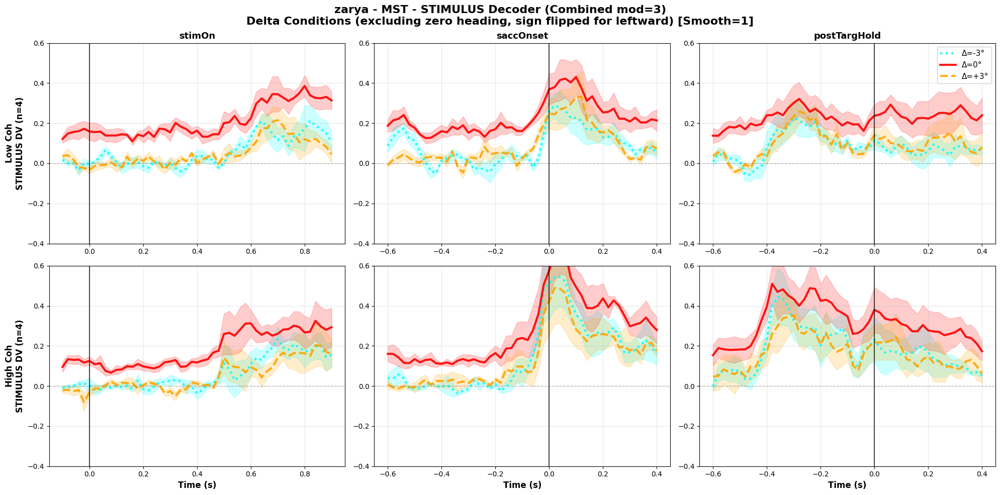


--- CHOICE DECODER (Delta Conditions Only) ---

Processing MST - choice - stimOn - mod=3 coh=1
  Found 4 sessions: ['20250702', '20250710', '20250523', '20250602']
  Delta keys found: ['delta_-3.0', 'delta_0.0', 'delta_3.0']
  delta_-3.0: 4 sessions
  delta_0.0: 4 sessions
  delta_3.0: 4 sessions
  Plotting delta_-3.0: 51 points
  Plotting delta_0.0: 51 points
  Plotting delta_3.0: 51 points

Processing MST - choice - saccOnset - mod=3 coh=1
  Found 4 sessions: ['20250702', '20250710', '20250523', '20250602']


KeyboardInterrupt: 

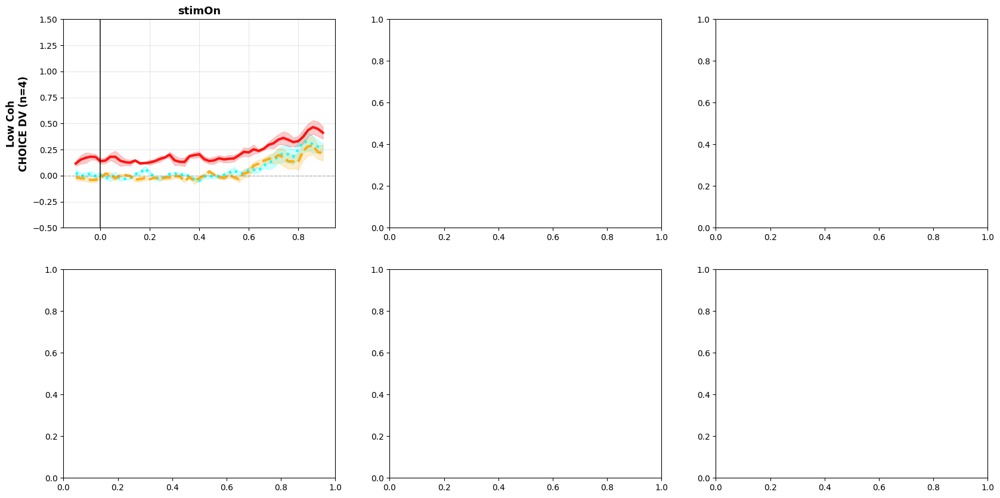

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.ndimage import uniform_filter1d

def load_decoder_results(subject, date, area, target, alignment, train_mod, train_coh, 
                         test_mod=None, test_coh=None, regress_type='partialregress'):
    """Load saved decoder results (training results)."""
    test_mod = test_mod or train_mod
    test_coh = test_coh or train_coh
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}')
    filename = (f"{subject}_{date}_{area}_{target}_{alignment}_"
                f"train_mod{train_mod}_coh{train_coh}_"
                f"test_mod{test_mod}_coh{test_coh}_results.npy")
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def load_delta_test_results(subject, date, area, target, alignment, train_mod, train_coh, 
                            regress_type='partialregress'):
    """Load saved delta test results (separate file)."""
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}_deltatests')
    filename = f"{subject}_{date}_{area}_{target}_{alignment}_trainMod{train_mod}Coh{train_coh}_deltatest.npy"
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def get_available_sessions(subject, area, target, alignment, mod, coh, regress_type='partialregress'):
    """Find all available sessions."""
    all_sessions = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    available = []
    
    for date in all_sessions:
        # Check if delta test file exists
        delta_results = load_delta_test_results(subject, date, area, target, alignment,
                                               train_mod=mod, train_coh=coh, regress_type=regress_type)
        if delta_results is not None:
            delta_data = delta_results.get('delta_results', {})
            if len(delta_data) > 0:
                available.append(date)
    
    return available

def extract_dv_delta_conditions(subject, sessions, area, target, alignment, mod, coh, 
                                regress_type='partialregress', smooth_window=1):
    """
    Extract DVs for delta conditions only (mod=3, pooling all headings).
    For stimulus decoder: exclude zero heading and flip sign for leftward headings.
    """
    
    # First pass: discover all delta keys
    all_delta_keys = set()
    for date in sessions:
        delta_results = load_delta_test_results(subject, date, area, target, alignment,
                                               train_mod=mod, train_coh=coh, regress_type=regress_type)
        if delta_results is not None:
            delta_data = delta_results.get('delta_results', {})
            for key in delta_data.keys():
                all_delta_keys.add(key)
    
    if not all_delta_keys:
        print(f"  No delta test files found")
        return None
    
    all_delta_keys = sorted(all_delta_keys)
    print(f"  Delta keys found: {all_delta_keys}")
    
    all_sessions_dv = {key: [] for key in all_delta_keys}
    all_sessions_dv['time_axis'] = None
    
    # Extract data
    for date in sessions:
        # Load main results to get time axis
        results = load_decoder_results(subject, date, area, target, alignment,
                                      train_mod=mod, train_coh=coh, regress_type=regress_type)
        if results is None:
            continue
        
        time_axis = results.get('time_axes', {}).get(alignment, None)
        if all_sessions_dv['time_axis'] is None:
            all_sessions_dv['time_axis'] = time_axis
        
        # Load delta test results
        delta_results = load_delta_test_results(subject, date, area, target, alignment,
                                               train_mod=mod, train_coh=coh, regress_type=regress_type)
        
        if delta_results is None:
            continue
        
        delta_data = delta_results.get('delta_results', {})
        dv_by_time = {}
        
        for delta_key in all_delta_keys:
            if delta_key not in delta_data:
                continue
            
            delta_time_results = delta_data[delta_key].get('time_results', [])
            
            for time_result in delta_time_results:
                t = time_result['time']
                
                if t not in dv_by_time:
                    dv_by_time[t] = {key: [] for key in all_delta_keys}
                
                fold_results = time_result.get('fold_results', [])
                
                for fold_result in fold_results:
                    DVs = fold_result.get('DV', np.array([]))
                    behavior_fold = fold_result.get('behavior', {})
                    
                    if len(DVs) == 0:
                        continue
                    
                    headingInd = behavior_fold.get('headingInd', np.array([]))
                    
                    # Process each trial's DV
                    processed_dvs = []
                    for i, dv in enumerate(DVs):
                        if i >= len(headingInd):
                            continue
                        
                        h_idx = headingInd[i]
                        
                        # For stimulus decoder: exclude zero heading (headingInd=4)
                        if target == 'stimulus' and h_idx == 4:
                            continue
                        
                        # For stimulus decoder: flip sign for leftward headings
                        if target == 'stimulus' and h_idx in [1, 2, 3]:
                            processed_dvs.append(-dv)
                        else:
                            processed_dvs.append(dv)
                    
                    if len(processed_dvs) > 0:
                        dv_by_time[t][delta_key].append(np.mean(processed_dvs))
        
        # Aggregate by time for this session
        session_dv = {key: [] for key in all_delta_keys}
        
        for t in sorted(dv_by_time.keys()):
            for key in all_delta_keys:
                if len(dv_by_time[t][key]) > 0:
                    session_dv[key].append(np.mean(dv_by_time[t][key]))
                else:
                    session_dv[key].append(np.nan)
        
        # Apply smoothing
        for key in all_delta_keys:
            if len(session_dv[key]) > 0:
                if smooth_window > 1:
                    session_dv[key] = uniform_filter1d(session_dv[key], size=smooth_window, mode='nearest')
                all_sessions_dv[key].append(session_dv[key])
    
    # Print summary
    for key in all_delta_keys:
        n_sessions = len([s for s in all_sessions_dv[key] if len(s) > 0 and not np.all(np.isnan(s))])
        if n_sessions > 0:
            print(f"  {key}: {n_sessions} sessions")
    
    # Aggregate across sessions
    result = {'time_axis': all_sessions_dv['time_axis'], 'delta_keys': all_delta_keys}
    
    for key in all_delta_keys:
        if len(all_sessions_dv[key]) > 0:
            valid_arrays = [dv for dv in all_sessions_dv[key] if len(dv) > 0]
            if len(valid_arrays) > 0:
                min_len = min(len(dv) for dv in valid_arrays)
                aligned = [dv[:min_len] for dv in valid_arrays]
                result[key + '_mean'] = np.nanmean(aligned, axis=0)
                result[key + '_sem'] = np.nanstd(aligned, axis=0) / np.sqrt(len(aligned))
            else:
                result[key + '_mean'] = np.array([])
                result[key + '_sem'] = np.array([])
        else:
            result[key + '_mean'] = np.array([])
            result[key + '_sem'] = np.array([])
    
    result['n_sessions'] = len([s for s in all_sessions_dv[all_delta_keys[0]] if len(s) > 0])
    
    return result

def plot_decoder_delta_conditions(subject, area, target, regress_type='partialregress', smooth_window=3):
    """
    Plot decoder DVs for delta conditions (mod=3, Combined only).
    Rows: Low Coh (coh=1), High Coh (coh=2)
    Columns: stimOn, saccOnset, postTargHold
    Lines: Δ=-3°, Δ=0°, Δ=+3°
    """
    
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    
    mod = 3  # Combined only
    
    for row, (coh, coh_label) in enumerate([(1, 'Low Coh'), (2, 'High Coh')]):
        for col, alignment in enumerate(alignments):
            ax = axes[row, col]
            
            print(f"\nProcessing {area} - {target} - {alignment} - mod={mod} coh={coh}")
            
            sessions = get_available_sessions(subject, area, target, alignment, mod, coh, regress_type)
            
            if len(sessions) == 0:
                print(f"  No sessions found")
                ax.text(0.5, 0.5, 'No Data', ha='center', va='center', transform=ax.transAxes)
                continue
            
            print(f"  Found {len(sessions)} sessions: {sessions}")
            
            dv_data = extract_dv_delta_conditions(subject, sessions, area, target, alignment, 
                                                  mod, coh, regress_type, smooth_window=smooth_window)
            
            if dv_data is None or dv_data['n_sessions'] == 0:
                print(f"  No delta data")
                ax.text(0.5, 0.5, 'No Delta Data', ha='center', va='center', transform=ax.transAxes)
                continue
            
            time_axis = dv_data['time_axis']
            n_sessions = dv_data['n_sessions']
            
            if time_axis is None:
                print(f"  No time axis")
                continue
            
            # Plot delta conditions
            delta_colors = {'delta_-3.0': 'cyan', 'delta_0.0': 'red', 'delta_3.0': 'orange'}
            delta_labels = {'delta_-3.0': 'Δ=-3°', 'delta_0.0': 'Δ=0°', 'delta_3.0': 'Δ=+3°'}
            delta_styles = {'delta_-3.0': ':', 'delta_0.0': '-', 'delta_3.0': '--'}
            
            for delta_key in dv_data.get('delta_keys', []):
                mean_key = delta_key + '_mean'
                sem_key = delta_key + '_sem'
                
                if mean_key not in dv_data or len(dv_data[mean_key]) == 0:
                    continue
                
                time_vals = time_axis[:len(dv_data[mean_key])]
                color = delta_colors.get(delta_key, 'gray')
                label = delta_labels.get(delta_key, delta_key)
                linestyle = delta_styles.get(delta_key, '-')
                
                print(f"  Plotting {delta_key}: {len(time_vals)} points")
                
                ax.plot(time_vals, dv_data[mean_key], color=color, linestyle=linestyle, 
                       linewidth=3, label=label, alpha=0.9)
                ax.fill_between(time_vals, 
                               dv_data[mean_key] - dv_data[sem_key],
                               dv_data[mean_key] + dv_data[sem_key], 
                               color=color, alpha=0.2)
            
            # Formatting
            ax.axhline(0, color='gray', linestyle='--', linewidth=1, alpha=0.5)
            ax.axvline(0, color='black', linestyle='-', linewidth=1.5, alpha=0.7)
            ax.grid(True, alpha=0.3)
            
            if target == 'choice':
                ax.set_ylim([-0.5, 1.5])
            elif target == 'PDW':
                ax.set_ylim([-0.5, 2.0])
            else:  # stimulus
                ax.set_ylim([-0.4, 0.6])
            
            if col == 0:
                ax.set_ylabel(f'{coh_label}\n{target.upper()} DV (n={n_sessions})', 
                             fontsize=12, fontweight='bold')
            
            if row == 1:
                ax.set_xlabel('Time (s)', fontsize=12, fontweight='bold')
            
            if row == 0:
                ax.set_title(f'{alignment}', fontsize=13, fontweight='bold')
            
            if row == 0 and col == 2:
                ax.legend(fontsize=11, loc='best', framealpha=0.9)
    
    note = "(excluding zero heading, sign flipped for leftward)" if target == 'stimulus' else "(all headings pooled)"
    plt.suptitle(f'{subject} - {area} - {target.upper()} Decoder (Combined mod=3)\n'
                 f'Delta Conditions {note} [Smooth={smooth_window}]', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    
    # Save to results folder
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoder_plots')
    save_dir.mkdir(parents=True, exist_ok=True)
    save_path = save_dir / f'DV_{target}_delta_only_{subject}_{area}_{regress_type}_smooth{smooth_window}.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"\nSaved: {save_path}")
    plt.show()

if __name__ == "__main__":
    subject = "zarya"
    regress_type = 'noregress'
    
    SMOOTH_WINDOW = 1
    
    for area in ['MST', 'VPS']:
        print(f"\n{'='*70}\nAREA: {area}\n{'='*70}")
        
        for target in ['stimulus', 'choice', 'PDW']:
            print(f"\n--- {target.upper()} DECODER (Delta Conditions Only) ---")
            plot_decoder_delta_conditions(subject, area, target, regress_type, smooth_window=SMOOTH_WINDOW)
    
    print("\nAll decoder plots completed!")

In [ ]:
# results =  np.load(r"D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_noregress\zarya_20250602_MST_stimulus_stimOn_train_mod3_coh2_test_mod3_coh2_results.npy", allow_pickle=True)
results.item()

### weigths broadly / narrowly distributed 


Effective Dimensionality Analysis (Percentage): MST


TARGET: STIMULUS

stimOn:
  Vestibular: 6 sessions, avg 162.0 units, mean ED = 6.36%
  Visual Low: 6 sessions, avg 162.0 units, mean ED = 7.08%
  Visual High: 6 sessions, avg 162.0 units, mean ED = 5.80%
  Combined Low: 6 sessions, avg 162.0 units, mean ED = 7.11%
  Combined High: 6 sessions, avg 162.0 units, mean ED = 6.12%

saccOnset:
  Vestibular: 6 sessions, avg 162.0 units, mean ED = 6.35%
  Visual Low: 6 sessions, avg 162.0 units, mean ED = 6.56%
  Visual High: 6 sessions, avg 162.0 units, mean ED = 5.29%
  Combined Low: 6 sessions, avg 162.0 units, mean ED = 7.34%
  Combined High: 6 sessions, avg 162.0 units, mean ED = 5.54%

postTargHold:
  Vestibular: 6 sessions, avg 162.0 units, mean ED = 5.75%
  Visual Low: 6 sessions, avg 162.0 units, mean ED = 6.45%
  Visual High: 6 sessions, avg 162.0 units, mean ED = 5.22%
  Combined Low: 6 sessions, avg 162.0 units, mean ED = 7.12%
  Combined High: 6 sessions, avg 162.0 units, mean 

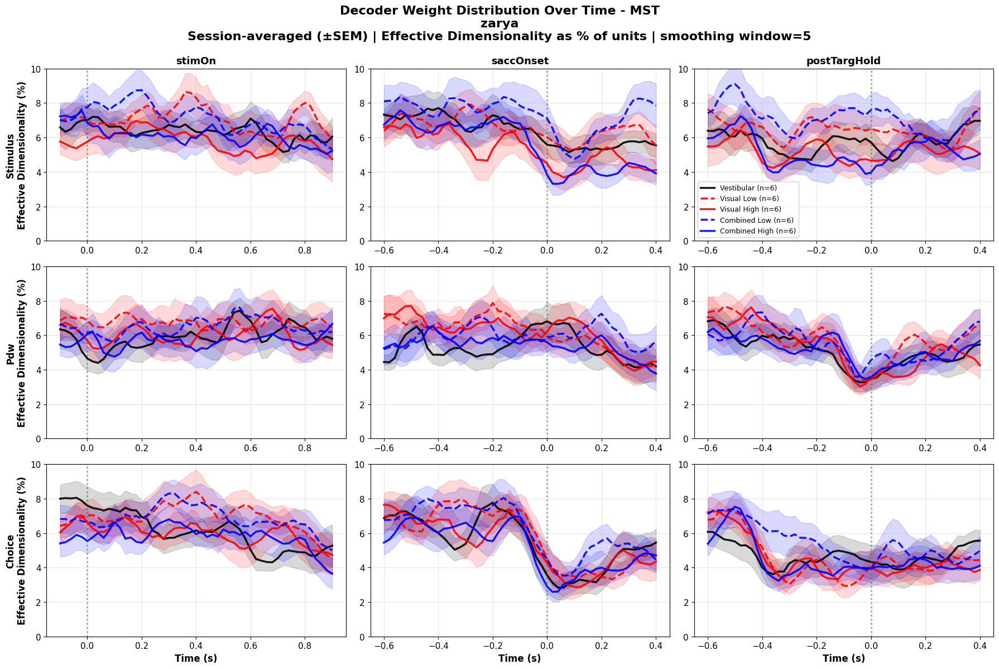


Effective Dimensionality Analysis (Percentage): VPS


TARGET: STIMULUS

stimOn:
  Vestibular: 6 sessions, avg 162.0 units, mean ED = 7.02%
  Visual Low: 6 sessions, avg 162.0 units, mean ED = 7.41%
  Visual High: 6 sessions, avg 162.0 units, mean ED = 6.74%
  Combined Low: 6 sessions, avg 162.0 units, mean ED = 7.93%
  Combined High: 6 sessions, avg 162.0 units, mean ED = 7.04%

saccOnset:
  Vestibular: 6 sessions, avg 162.0 units, mean ED = 6.58%
  Visual Low: 6 sessions, avg 162.0 units, mean ED = 7.28%
  Visual High: 6 sessions, avg 162.0 units, mean ED = 6.30%
  Combined Low: 6 sessions, avg 162.0 units, mean ED = 7.87%
  Combined High: 6 sessions, avg 162.0 units, mean ED = 6.18%

postTargHold:
  Vestibular: 6 sessions, avg 162.0 units, mean ED = 6.11%
  Visual Low: 6 sessions, avg 162.0 units, mean ED = 6.70%
  Visual High: 6 sessions, avg 162.0 units, mean ED = 5.17%
  Combined Low: 6 sessions, avg 162.0 units, mean ED = 7.43%
  Combined High: 6 sessions, avg 162.0 units, mean 

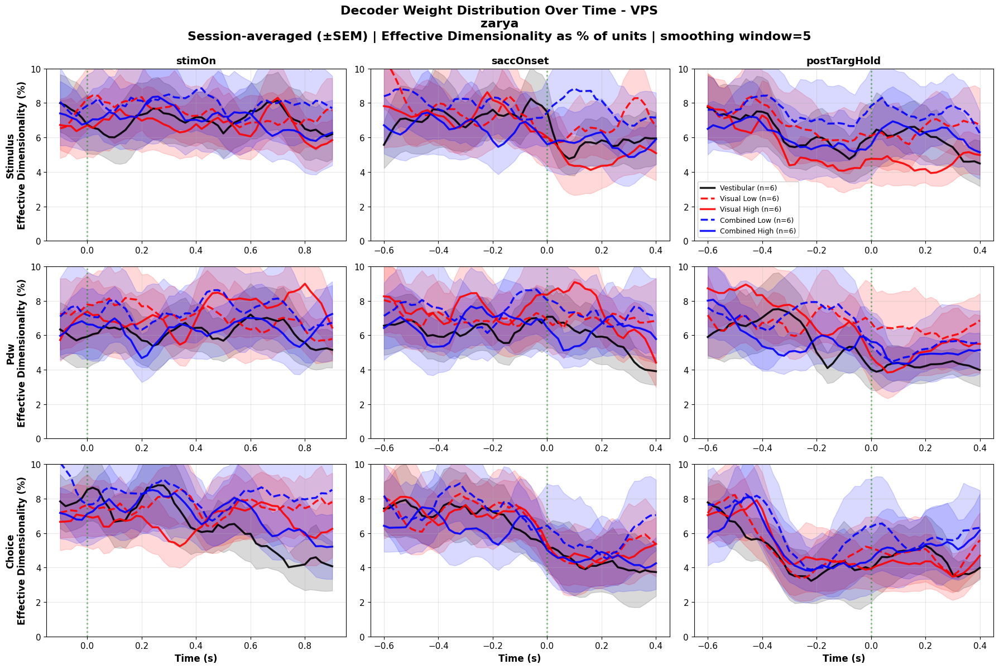


All percentage ED analyses completed!


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def load_decoder_results(subject, date, area, target, alignment, train_mod, train_coh, 
                         test_mod=None, test_coh=None, regress_type='noregress'):
    """Load saved decoder results."""
    test_mod = test_mod or train_mod
    test_coh = test_coh or train_coh
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}')
    filename = (f"{subject}_{date}_{area}_{target}_{alignment}_"
                f"train_mod{train_mod}_coh{train_coh}_"
                f"test_mod{test_mod}_coh{test_coh}_results.npy")
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def check_valid_decoder_data(results):
    """Check if decoder results contain valid, meaningful data."""
    if results is None:
        return False
    weights = results.get('coefficients_mean', None)
    if weights is None or len(weights) == 0:
        return False
    if np.all(np.isnan(weights)) or np.all(weights == 0):
        return False
    if np.std(weights) < 1e-10:
        return False
    return True

def get_available_sessions(subject, area, target, alignment, mod, coh, regress_type='noregress'):
    """Find all available sessions for a given condition."""
    all_sessions = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    available = []
    
    for date in all_sessions:
        results = load_decoder_results(subject, date, area, target, alignment, 
                                      train_mod=mod, train_coh=coh, regress_type=regress_type)
        if check_valid_decoder_data(results):
            available.append(date)
    
    return available

def compute_effective_dimensionality_percent(weights):
    """
    Compute effective dimensionality as PERCENTAGE of units.
    
    Percentage = (1/Σw²) / N_units * 100
    
    Range: [100/N, 100] where 100/N% = one unit active, 100% = all units equally active
    """
    n_time, n_units = weights.shape
    effective_dims_pct = []
    
    for t in range(n_time):
        w = np.abs(weights[t, :])
        w_sum = np.sum(w)
        
        if w_sum < 1e-10:
            effective_dims_pct.append(np.nan)
            continue
        
        w_norm = w / w_sum
        ed_raw = 1 / np.sum(w_norm**2)
        ed_percent = (ed_raw / n_units) * 100  # Convert to percentage
        
        effective_dims_pct.append(ed_percent)
    
    return np.array(effective_dims_pct)

def compute_session_ed(subject, date, area, target, alignment, mod, coh, regress_type='noregress'):
    """Compute effective dimensionality for a SINGLE session."""
    results = load_decoder_results(subject, date, area, target, alignment,
                                  train_mod=mod, train_coh=coh, regress_type=regress_type)
    
    if not check_valid_decoder_data(results):
        return None, None, 0
    
    weights = results.get('coefficients_mean')
    time_axis = results.get('time_axes', {}).get(alignment, None)
    n_units = weights.shape[1]
    
    ed_pct = compute_effective_dimensionality_percent(weights)
    
    return ed_pct, time_axis, n_units

def plot_effective_dimensionality_session_averaged(subject, area, regress_type='noregress',
                                                   smooth_window=3):
    """
    Plot effective dimensionality as PERCENTAGE averaged across sessions.
    Y-axis limited to 0-10%.
    """
    
    all_sessions = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    
    conditions = [
        (1, 1, 'Vestibular', 'black', '-'),
        (2, 1, 'Visual Low', 'red', '--'),
        (2, 2, 'Visual High', 'red', '-'),
        (3, 1, 'Combined Low', 'blue', '--'),
        (3, 2, 'Combined High', 'blue', '-'),
    ]
    
    targets = ['stimulus', 'PDW', 'choice']
    alignments = ['stimOn', 'saccOnset', 'postTargHold']
    
    fig, axes = plt.subplots(len(targets), len(alignments), 
                            figsize=(18, 4*len(targets)))
    
    print(f"\n{'='*70}")
    print(f"Effective Dimensionality Analysis (Percentage): {area}")
    print(f"{'='*70}\n")
    
    for row, target in enumerate(targets):
        print(f"\n{'='*70}")
        print(f"TARGET: {target.upper()}")
        print(f"{'='*70}")
        
        for col, alignment in enumerate(alignments):
            ax = axes[row, col]
            
            print(f"\n{alignment}:")
            
            has_data = False
            
            for mod, coh, label, color, linestyle in conditions:
                
                # Get available sessions for this condition
                sessions = get_available_sessions(subject, area, target, alignment, 
                                                 mod, coh, regress_type)
                
                if len(sessions) == 0:
                    print(f"  {label}: No sessions")
                    continue
                
                # Compute ED for each session
                all_ed = []
                all_units = []
                time_axis = None
                
                for date in sessions:
                    ed_pct, time_ax, n_units = compute_session_ed(
                        subject, date, area, target, alignment, mod, coh, regress_type)
                    
                    if ed_pct is not None:
                        all_ed.append(ed_pct)
                        all_units.append(n_units)
                        if time_axis is None:
                            time_axis = time_ax
                
                if len(all_ed) == 0:
                    print(f"  {label}: No valid data")
                    continue
                
                has_data = True
                
                # Align to shortest time series
                min_len = min(len(ed) for ed in all_ed)
                all_ed = [ed[:min_len] for ed in all_ed]
                all_ed = np.array(all_ed)
                
                if time_axis is not None:
                    time_axis = np.array(time_axis)[:min_len]
                
                # Compute mean and SEM across sessions
                mean_ed = np.nanmean(all_ed, axis=0)
                sem_ed = np.nanstd(all_ed, axis=0) / np.sqrt(len(all_ed))
                
                # Optional: smooth
                if smooth_window > 1:
                    from scipy.ndimage import uniform_filter1d
                    mean_ed = uniform_filter1d(mean_ed, size=smooth_window, mode='nearest')
                    sem_ed = uniform_filter1d(sem_ed, size=smooth_window, mode='nearest')
                
                # Plot
                ax.plot(time_axis, mean_ed, label=f'{label} (n={len(all_ed)})', 
                       color=color, linestyle=linestyle, linewidth=2.5, alpha=0.9)
                ax.fill_between(time_axis, mean_ed - sem_ed, mean_ed + sem_ed,
                               color=color, alpha=0.15)
                
                # Print summary
                mean_units = np.mean(all_units)
                mean_ed_val = np.nanmean(mean_ed)
                print(f"  {label}: {len(sessions)} sessions, "
                      f"avg {mean_units:.1f} units, "
                      f"mean ED = {mean_ed_val:.2f}%")
            
            if not has_data:
                ax.text(0.5, 0.5, 'No Data', 
                       ha='center', va='center', transform=ax.transAxes,
                       fontsize=14, color='red')
            else:
                # Formatting
                ax.axvline(0, color='green', linestyle=':', linewidth=2, alpha=0.5)
                ax.axhline(10.0, color='gray', linestyle='--', linewidth=1, alpha=0.3)
                ax.grid(True, alpha=0.3)
                ax.set_ylim([0, 10])  # Set to 0-10%
                ax.tick_params(labelsize=11)
            
            # Labels
            if row == len(targets) - 1:
                ax.set_xlabel('Time (s)', fontsize=12, fontweight='bold')
            if col == 0:
                ax.set_ylabel(f'{target.capitalize()}\nEffective Dimensionality (%)', 
                            fontsize=12, fontweight='bold')
            
            if row == 0:
                ax.set_title(alignment, fontsize=13, fontweight='bold')
            
            if row == 0 and col == len(alignments) - 1:
                ax.legend(fontsize=9, loc='best', framealpha=0.9)
    
    plt.suptitle(f'Decoder Weight Distribution Over Time - {area}\n{subject}\n'
                 f'Session-averaged (±SEM) | Effective Dimensionality as % of units | smoothing window={smooth_window}', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    
    save_path = f'effective_dimensionality_percent_{area}_{regress_type}_smooth{smooth_window}.png'
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"\n{'='*70}")
    print(f"Saved: {save_path}")
    print(f"{'='*70}")
    plt.show()

# Run it
if __name__ == "__main__":
    subject = "zarya"
    regress_type = 'noregress_10nfold'
    
    SMOOTH_WINDOW = 5  # Temporal smoothing window
    
    for area in ['MST', 'VPS']:
        plot_effective_dimensionality_session_averaged(subject, area, regress_type,
                                                      smooth_window=SMOOTH_WINDOW)
    
    print("\nAll percentage ED analyses completed!")

### choice / stimlus by mod + heading + correctness + pdw


PROCESSING CHOICE DECODER


Processing VPS...
  Processing Vestibular...
  Processing Visual Low Coh...
  Processing Visual High Coh...
  Processing Combined Low Coh...
  Processing Combined High Coh...
  Processing ±10°...
  Processing ±3.9°...
  Processing ±1.5°...
  Processing 0°...
  Processing correct vs error trials...
  Processing high vs low PDW trials...

Processing MST...
  Processing Vestibular...
  Processing Visual Low Coh...
  Processing Visual High Coh...
  Processing Combined Low Coh...
  Processing Combined High Coh...
  Processing ±10°...
  Processing ±3.9°...
  Processing ±1.5°...
  Processing 0°...
  Processing correct vs error trials...
  Processing high vs low PDW trials...

Figure saved as: D:\Neural-Pipeline\results\analysis_pseudopopulation\zarya_choice_decoder_accuracy_8subplots_pseudopop.png


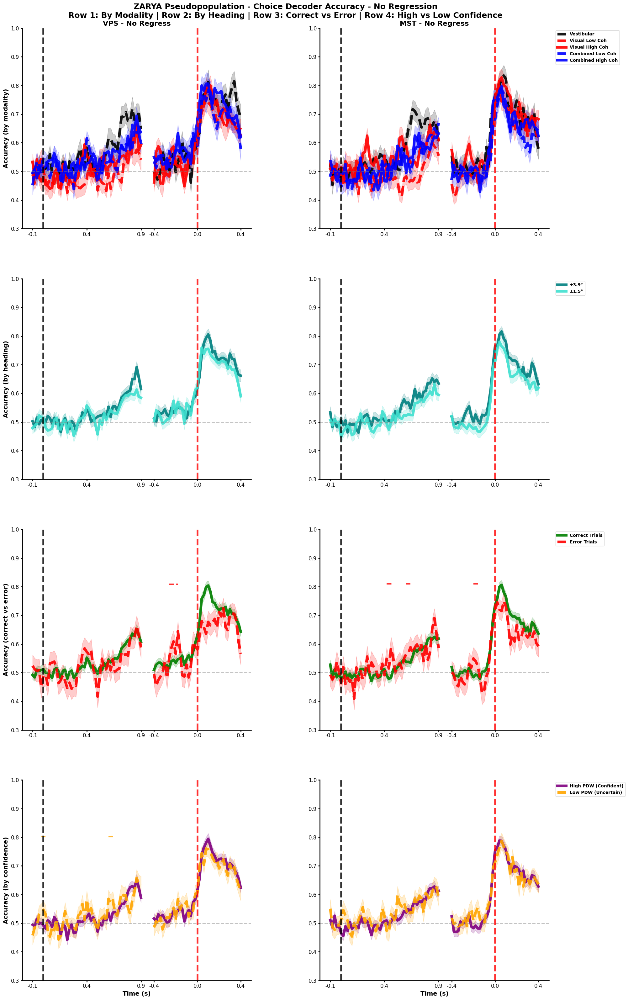


PROCESSING STIMULUS DECODER


Processing VPS...
  Processing Vestibular...
  Processing Visual Low Coh...
  Processing Visual High Coh...
  Processing Combined Low Coh...
  Processing Combined High Coh...
  Note: Excluding 0° heading for stimulus decoder
  Processing ±10°...
  Processing ±3.9°...
  Processing ±1.5°...
  Processing correct vs error trials...
  Processing high vs low PDW trials...

Processing MST...
  Processing Vestibular...
  Processing Visual Low Coh...
  Processing Visual High Coh...
  Processing Combined Low Coh...
  Processing Combined High Coh...
  Note: Excluding 0° heading for stimulus decoder
  Processing ±10°...
  Processing ±3.9°...
  Processing ±1.5°...
  Processing correct vs error trials...
  Processing high vs low PDW trials...

Figure saved as: D:\Neural-Pipeline\results\analysis_pseudopopulation\zarya_stimulus_decoder_accuracy_8subplots_pseudopop.png


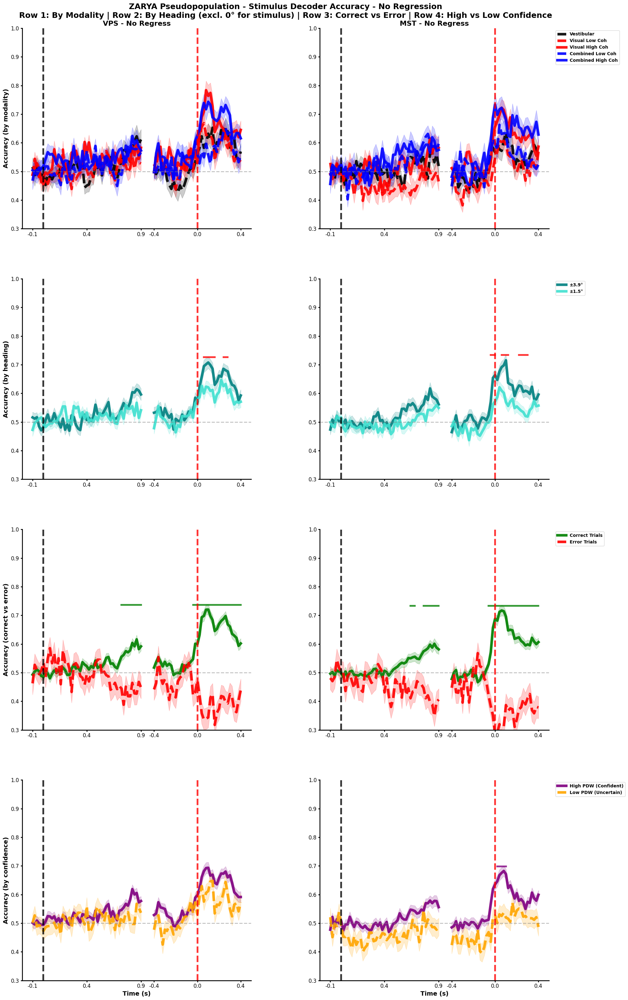


All pseudopopulation decoder accuracy plots completed!


In [2]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
from pathlib import Path

# Define heading groups with colors
heading_groups = {
    '±10°': ([1, 7], "#004D4D"),
    '±3.9°': ([2, 6], "#008080"),
    '±1.5°': ([3, 5], "#40E0D0"),
    '0°': ([4], "#A2A2A2")
}   

# Define modality/coherence combinations
modality_styles = [
    {'name': 'Vestibular', 'mod': 1, 'coh': 1, 'color': 'black', 'linestyle': '--'},
    {'name': 'Visual Low Coh', 'mod': 2, 'coh': 1, 'color': 'red', 'linestyle': '--'},
    {'name': 'Visual High Coh', 'mod': 2, 'coh': 2, 'color': 'red', 'linestyle': '-'},
    {'name': 'Combined Low Coh', 'mod': 3, 'coh': 1, 'color': 'blue', 'linestyle': '--'},
    {'name': 'Combined High Coh', 'mod': 3, 'coh': 2, 'color': 'blue', 'linestyle': '-'}
]

def load_decoder_results(subject, date, area, target, alignment, train_mod, train_coh, 
                         test_mod=None, test_coh=None, regress_type='noregress'):
    """Load saved decoder results."""
    test_mod = test_mod or train_mod
    test_coh = test_coh or train_coh
    save_dir = Path(rf'D:\Neural-Pipeline\results\analysis_pseudopopulation\decoders_{regress_type}')
    filename = (f"{subject}_{date}_{area}_{target}_{alignment}_"
                f"train_mod{train_mod}_coh{train_coh}_"
                f"test_mod{test_mod}_coh{test_coh}_results.npy")
    filepath = save_dir / filename
    return np.load(filepath, allow_pickle=True).item() if filepath.exists() else None

def get_available_sessions(subject, area, target, alignment, mod, coh, regress_type='noregress'):
    """Find all available sessions."""
    all_sessions = ["20250702", "20250710", "20250523", "20250501", "20250417", "20250602"]
    available = []
    
    for date in all_sessions:
        results = load_decoder_results(subject, date, area, target, alignment,
                                      train_mod=mod, train_coh=coh, regress_type=regress_type)
        if results is not None:
            trial_results = results.get('trial_results', [])
            if len(trial_results) > 0:
                available.append(date)
    
    return available

def compute_accuracy_from_proba(y_proba, true_label):
    """
    Compute accuracy from probabilities.
    y_proba: probability of class 1
    true_label: actual class (0 or 1)
    """
    y_pred = (y_proba >= 0.5).astype(int)
    return (y_pred == true_label).astype(float)

# Fixed parameters
subject = "zarya"
areas = ['VPS', 'MST']
regression_method = 'noregress'
selected_alignments = ['stimOn', 'saccOnset']

# Loop through both targets
for target in ['choice', 'stimulus']:
    print(f"\n{'='*80}")
    print(f"PROCESSING {target.upper()} DECODER")
    print(f"{'='*80}\n")
    
    fig, axes = plt.subplots(4, 2, figsize=(20, 32))
    
    # Get time axes
    stimon_time_axis = None
    saccade_time_axis = None
    
    for area_idx, area in enumerate(areas):
        print(f"\nProcessing {area}...")
        
        # Get time axes
        if stimon_time_axis is None:
            for mod_config in modality_styles:
                sessions = get_available_sessions(subject, area, target, 'stimOn', 
                                                 mod_config['mod'], mod_config['coh'], regression_method)
                if len(sessions) > 0:
                    results = load_decoder_results(subject, sessions[0], area, target, 'stimOn',
                                                  mod_config['mod'], mod_config['coh'], 
                                                  regress_type=regression_method)
                    if results:
                        time_axes_dict = results.get('time_axes', {})
                        stimon_time_axis = time_axes_dict.get('stimOn', None)
                        saccade_time_axis = time_axes_dict.get('saccOnset', None)
                        if stimon_time_axis is not None and saccade_time_axis is not None:
                            break
                if stimon_time_axis is not None:
                    break
        
        if stimon_time_axis is None or saccade_time_axis is None:
            print(f"Could not find time axes for {area}")
            continue
        
        # For saccOnset, trim to -400ms onwards
        saccade_start_idx = np.where(saccade_time_axis >= -0.4)[0][0]
        saccade_time_axis_trimmed = saccade_time_axis[saccade_start_idx:]
        
        # Create combined indices
        stimon_indices = np.arange(len(stimon_time_axis))
        gap_size = 5
        saccade_indices = np.arange(len(saccade_time_axis_trimmed)) + len(stimon_time_axis) + gap_size
        
        # ============================================================
        # ROW 0: BY MODALITY
        # ============================================================
        ax_modality = axes[0, area_idx]
        
        for mod_config in modality_styles:
            print(f"  Processing {mod_config['name']}...")
            
            mod = mod_config['mod']
            coh = mod_config['coh']
            color = mod_config['color']
            linestyle = mod_config['linestyle']
            
            sessions = get_available_sessions(subject, area, target, 'stimOn', mod, coh, regression_method)
            if len(sessions) == 0:
                continue
            
            stimon_acc_by_time = {t: [] for t in range(len(stimon_time_axis))}
            saccade_acc_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
            
            for alignment in selected_alignments:
                for date in sessions:
                    results = load_decoder_results(subject, date, area, target, alignment,
                                                  mod, coh, regress_type=regression_method)
                    if results is None:
                        continue
                    
                    trial_results = results.get('trial_results', [])
                    
                    for trial in trial_results:
                        t = trial['time']
                        
                        # Get test_cv data
                        test_cv = trial.get('test_cv', {})
                        y_proba = np.array(test_cv.get('y_proba', []))
                        behavior = test_cv.get('behavior', {})
                        
                        if len(y_proba) == 0 or len(behavior) == 0:
                            continue
                        
                        # Get true labels based on target
                        if target == 'choice':
                            true_label = np.array(behavior.get('choice', []))
                            # Convert from 1/2 to 0/1 if needed
                            if len(true_label) > 0 and np.max(true_label) > 1:
                                true_label = (true_label - 1).astype(int)
                        else:  # stimulus
                            headingInd = np.array(behavior.get('headingInd', []))
                            true_label = (headingInd > 4).astype(int)
                        
                        if len(true_label) != len(y_proba):
                            continue
                        
                        # Compute accuracy
                        accuracies = compute_accuracy_from_proba(y_proba, true_label)
                        accuracy = np.mean(accuracies)
                        
                        if alignment == 'stimOn':
                            if 0 <= t < len(stimon_time_axis):
                                stimon_acc_by_time[t].append(accuracy)
                        else:
                            t_trimmed = t - saccade_start_idx
                            if 0 <= t_trimmed < len(saccade_time_axis_trimmed):
                                saccade_acc_by_time[t_trimmed].append(accuracy)
            
            # Baseline correction
            baseline_acc = 0.5
            baseline_acc_vals = []
            for t in range(len(stimon_time_axis)):
                if stimon_time_axis[t] < 0 and stimon_acc_by_time[t]:
                    baseline_acc_vals.extend(stimon_acc_by_time[t])
            
            if baseline_acc_vals:
                baseline_acc = np.mean(baseline_acc_vals)
            
            # Calculate means and SEMs
            stimon_times = []
            stimon_acc_means = []
            stimon_acc_sems = []
            
            for t in range(len(stimon_time_axis)):
                if stimon_acc_by_time[t]:
                    stimon_times.append(stimon_indices[t])
                    stimon_acc_means.append(np.mean(stimon_acc_by_time[t]) - baseline_acc + 0.5)
                    stimon_acc_sems.append(stats.sem(stimon_acc_by_time[t]))
            
            saccade_times = []
            saccade_acc_means = []
            saccade_acc_sems = []
            
            for t in range(len(saccade_time_axis_trimmed)):
                if saccade_acc_by_time[t]:
                    saccade_times.append(saccade_indices[t])
                    saccade_acc_means.append(np.mean(saccade_acc_by_time[t]) - baseline_acc + 0.5)
                    saccade_acc_sems.append(stats.sem(saccade_acc_by_time[t]))
            
            # Plot
            if stimon_times:
                ax_modality.plot(stimon_times, stimon_acc_means, 
                               color=color, linestyle=linestyle, linewidth=6, 
                               label=mod_config['name'], alpha=0.9)
                ax_modality.fill_between(stimon_times,
                                       np.array(stimon_acc_means) - np.array(stimon_acc_sems),
                                       np.array(stimon_acc_means) + np.array(stimon_acc_sems),
                                       color=color, alpha=0.2)
            
            if saccade_times:
                ax_modality.plot(saccade_times, saccade_acc_means, 
                               color=color, linestyle=linestyle, linewidth=6, alpha=0.9)
                ax_modality.fill_between(saccade_times,
                                       np.array(saccade_acc_means) - np.array(saccade_acc_sems),
                                       np.array(saccade_acc_means) + np.array(saccade_acc_sems),
                                       color=color, alpha=0.2)
        
        # ============================================================
        # ROW 1: BY HEADING
        # ============================================================
        ax_heading = axes[1, area_idx]
        
        if target == 'stimulus':
            heading_groups_to_plot = {k: v for k, v in heading_groups.items() if k != '0°'}
            print(f"  Note: Excluding 0° heading for stimulus decoder")
        else:
            heading_groups_to_plot = heading_groups
        
        heading_data = {}
        all_heading_plot_data = {}
        
        for group_name, (heading_indices, heading_color) in heading_groups_to_plot.items():
            print(f"  Processing {group_name}...")
            
            heading_data[group_name] = {
                'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
                'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
            }
            
            stimon_acc_by_time = {t: [] for t in range(len(stimon_time_axis))}
            saccade_acc_by_time = {t: [] for t in range(len(saccade_time_axis_trimmed))}
            
            for mod_config in modality_styles:
                mod = mod_config['mod']
                coh = mod_config['coh']
                
                sessions = get_available_sessions(subject, area, target, 'stimOn', mod, coh, regression_method)
                
                for alignment in selected_alignments:
                    for date in sessions:
                        results = load_decoder_results(subject, date, area, target, alignment,
                                                      mod, coh, regress_type=regression_method)
                        if results is None:
                            continue
                        
                        trial_results = results.get('trial_results', [])
                        
                        for trial in trial_results:
                            t = trial['time']
                            
                            test_cv = trial.get('test_cv', {})
                            y_proba = np.array(test_cv.get('y_proba', []))
                            behavior = test_cv.get('behavior', {})
                            
                            if len(y_proba) == 0 or len(behavior) == 0:
                                continue
                            
                            headingInd = np.array(behavior.get('headingInd', []))
                            
                            if len(headingInd) == 0:
                                continue
                            
                            # Filter for this heading group
                            heading_mask = np.isin(headingInd, heading_indices)
                            
                            if not np.any(heading_mask):
                                continue
                            
                            y_proba_filtered = y_proba[heading_mask]
                            
                            # Get true labels
                            if target == 'choice':
                                true_label = np.array(behavior.get('choice', []))
                                if len(true_label) > 0 and np.max(true_label) > 1:
                                    true_label = (true_label - 1).astype(int)
                            else:
                                true_label = (headingInd > 4).astype(int)
                            
                            true_label_filtered = true_label[heading_mask]
                            
                            if len(true_label_filtered) != len(y_proba_filtered):
                                continue
                            
                            accuracies = compute_accuracy_from_proba(y_proba_filtered, true_label_filtered)
                            accuracy = np.mean(accuracies)
                            
                            if alignment == 'stimOn':
                                if 0 <= t < len(stimon_time_axis):
                                    stimon_acc_by_time[t].append(accuracy)
                                    heading_data[group_name]['stimon_acc'][t].append(accuracy)
                            else:
                                t_trimmed = t - saccade_start_idx
                                if 0 <= t_trimmed < len(saccade_time_axis_trimmed):
                                    saccade_acc_by_time[t_trimmed].append(accuracy)
                                    heading_data[group_name]['saccade_acc'][t_trimmed].append(accuracy)
            
            # Baseline correction
            baseline_acc = 0.5
            baseline_acc_vals = []
            for t in range(len(stimon_time_axis)):
                if stimon_time_axis[t] < 0 and stimon_acc_by_time[t]:
                    baseline_acc_vals.extend(stimon_acc_by_time[t])
            
            if baseline_acc_vals:
                baseline_acc = np.mean(baseline_acc_vals)
            
            all_heading_plot_data[group_name] = {
                'color': heading_color,
                'baseline_acc': baseline_acc,
                'stimon_acc_by_time': stimon_acc_by_time,
                'saccade_acc_by_time': saccade_acc_by_time
            }
        
        # Plot headings
        for group_name, plot_data in all_heading_plot_data.items():
            stimon_times = []
            stimon_acc_means = []
            stimon_acc_sems = []
            
            for t in range(len(stimon_time_axis)):
                if plot_data['stimon_acc_by_time'][t]:
                    stimon_times.append(stimon_indices[t])
                    stimon_acc_means.append(np.mean(plot_data['stimon_acc_by_time'][t]) - plot_data['baseline_acc'] + 0.5)
                    stimon_acc_sems.append(stats.sem(plot_data['stimon_acc_by_time'][t]))
            
            saccade_times = []
            saccade_acc_means = []
            saccade_acc_sems = []
            
            for t in range(len(saccade_time_axis_trimmed)):
                if plot_data['saccade_acc_by_time'][t]:
                    saccade_times.append(saccade_indices[t])
                    saccade_acc_means.append(np.mean(plot_data['saccade_acc_by_time'][t]) - plot_data['baseline_acc'] + 0.5)
                    saccade_acc_sems.append(stats.sem(plot_data['saccade_acc_by_time'][t]))
            
            if stimon_times:
                ax_heading.plot(stimon_times, stimon_acc_means, 
                              color=plot_data['color'], linestyle='-', linewidth=6, 
                              label=group_name, alpha=0.9)
                ax_heading.fill_between(stimon_times,
                                      np.array(stimon_acc_means) - np.array(stimon_acc_sems),
                                      np.array(stimon_acc_means) + np.array(stimon_acc_sems),
                                      color=plot_data['color'], alpha=0.2)
            
            if saccade_times:
                ax_heading.plot(saccade_times, saccade_acc_means, 
                              color=plot_data['color'], linestyle='-', linewidth=6, alpha=0.9)
                ax_heading.fill_between(saccade_times,
                                      np.array(saccade_acc_means) - np.array(saccade_acc_sems),
                                      np.array(saccade_acc_means) + np.array(saccade_acc_sems),
                                      color=plot_data['color'], alpha=0.2)
        
        # Correlation analysis
        y_min, y_max = ax_heading.get_ylim()
        line_y = y_max - 0.05 * (y_max - y_min)
        
        if target == 'stimulus':
            heading_order = ['±1.5°', '±3.9°', '±10°']
            heading_values = [1.5, 3.9, 10]
        else:
            heading_order = ['0°', '±1.5°', '±3.9°', '±10°']
            heading_values = [0, 1.5, 3.9, 10]
        
        corr_sig_times_pos = []
        corr_sig_times_neg = []
        
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] >= 0:
                all_headings = []
                all_values = []
                
                for i, group_name in enumerate(heading_order):
                    if group_name in heading_data:
                        group_values = heading_data[group_name]['stimon_acc'][t]
                        if group_values:
                            all_headings.extend([heading_values[i]] * len(group_values))
                            all_values.extend(group_values)
                
                if len(all_headings) >= 20:
                    r, p_val = stats.pearsonr(all_headings, all_values)
                    if p_val < 0.05:
                        if r > 0:
                            corr_sig_times_pos.append(stimon_indices[t])
                        else:
                            corr_sig_times_neg.append(stimon_indices[t])
        
        for t in range(len(saccade_time_axis_trimmed)):
            all_headings = []
            all_values = []
            
            for i, group_name in enumerate(heading_order):
                if group_name in heading_data:
                    group_values = heading_data[group_name]['saccade_acc'][t]
                    if group_values:
                        all_headings.extend([heading_values[i]] * len(group_values))
                        all_values.extend(group_values)
            
            if len(all_headings) >= 20:
                r, p_val = stats.pearsonr(all_headings, all_values)
                if p_val < 0.05:
                    if r > 0:
                        corr_sig_times_pos.append(saccade_indices[t])
                    else:
                        corr_sig_times_neg.append(saccade_indices[t])
        
        # Plot correlation lines
        if corr_sig_times_pos:
            sig_groups = []
            if len(corr_sig_times_pos) > 0:
                current_group = [corr_sig_times_pos[0]]
                for i in range(1, len(corr_sig_times_pos)):
                    if corr_sig_times_pos[i] - corr_sig_times_pos[i-1] == 1:
                        current_group.append(corr_sig_times_pos[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [corr_sig_times_pos[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_heading.plot([group[0], group[-1]], [line_y, line_y], 
                                  color='red', linestyle='-', linewidth=4, alpha=0.8)
        
        if corr_sig_times_neg:
            sig_groups = []
            if len(corr_sig_times_neg) > 0:
                current_group = [corr_sig_times_neg[0]]
                for i in range(1, len(corr_sig_times_neg)):
                    if corr_sig_times_neg[i] - corr_sig_times_neg[i-1] == 1:
                        current_group.append(corr_sig_times_neg[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [corr_sig_times_neg[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_heading.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), 
                                                            line_y - 0.02 * (y_max - y_min)], 
                                  color='blue', linestyle='--', linewidth=3, alpha=0.8)
        
        # ============================================================
        # ROW 2: CORRECT vs ERROR
        # ============================================================
        ax_correct_error = axes[2, area_idx]
        
        print(f"  Processing correct vs error trials...")
        
        non_zero_heading_indices = [1, 2, 3, 5, 6, 7]
        
        correct_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        error_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        for mod_config in modality_styles:
            mod = mod_config['mod']
            coh = mod_config['coh']
            
            sessions = get_available_sessions(subject, area, target, 'stimOn', mod, coh, regression_method)
            
            for alignment in selected_alignments:
                for date in sessions:
                    results = load_decoder_results(subject, date, area, target, alignment,
                                                  mod, coh, regress_type=regression_method)
                    if results is None:
                        continue
                    
                    trial_results = results.get('trial_results', [])
                    
                    for trial in trial_results:
                        t = trial['time']
                        
                        test_cv = trial.get('test_cv', {})
                        y_proba = np.array(test_cv.get('y_proba', []))
                        behavior = test_cv.get('behavior', {})
                        
                        if len(y_proba) == 0 or len(behavior) == 0:
                            continue
                        
                        headingInd = np.array(behavior.get('headingInd', []))
                        correct = np.array(behavior.get('correct', []))
                        
                        if len(headingInd) == 0 or len(correct) == 0:
                            continue
                        
                        # Filter non-zero headings
                        non_zero_mask = np.isin(headingInd, non_zero_heading_indices)
                        
                        if not np.any(non_zero_mask):
                            continue
                        
                        y_proba_filtered = y_proba[non_zero_mask]
                        correct_filtered = correct[non_zero_mask]
                        
                        # Get true labels
                        if target == 'choice':
                            true_label = np.array(behavior.get('choice', []))
                            if len(true_label) > 0 and np.max(true_label) > 1:
                                true_label = (true_label - 1).astype(int)
                        else:
                            true_label = (headingInd > 4).astype(int)
                        
                        true_label_filtered = true_label[non_zero_mask]
                        
                        # Split by correct/error
                        correct_mask = (correct_filtered == 1)
                        error_mask = (correct_filtered == 0)
                        
                        if np.any(correct_mask):
                            accuracies = compute_accuracy_from_proba(y_proba_filtered[correct_mask], 
                                                                     true_label_filtered[correct_mask])
                            acc_correct = np.mean(accuracies)
                            
                            if alignment == 'stimOn':
                                if 0 <= t < len(stimon_time_axis):
                                    correct_data['stimon_acc'][t].append(acc_correct)
                            else:
                                t_trimmed = t - saccade_start_idx
                                if 0 <= t_trimmed < len(saccade_time_axis_trimmed):
                                    correct_data['saccade_acc'][t_trimmed].append(acc_correct)
                        
                        if np.any(error_mask):
                            accuracies = compute_accuracy_from_proba(y_proba_filtered[error_mask], 
                                                                     true_label_filtered[error_mask])
                            acc_error = np.mean(accuracies)
                            
                            if alignment == 'stimOn':
                                if 0 <= t < len(stimon_time_axis):
                                    error_data['stimon_acc'][t].append(acc_error)
                            else:
                                t_trimmed = t - saccade_start_idx
                                if 0 <= t_trimmed < len(saccade_time_axis_trimmed):
                                    error_data['saccade_acc'][t_trimmed].append(acc_error)
        
        # Baseline corrections
        baseline_acc_correct = 0.5
        baseline_acc_vals = []
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] < 0 and correct_data['stimon_acc'][t]:
                baseline_acc_vals.extend(correct_data['stimon_acc'][t])
        if baseline_acc_vals:
            baseline_acc_correct = np.mean(baseline_acc_vals)
        
        baseline_acc_error = 0.5
        baseline_acc_vals = []
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] < 0 and error_data['stimon_acc'][t]:
                baseline_acc_vals.extend(error_data['stimon_acc'][t])
        if baseline_acc_vals:
            baseline_acc_error = np.mean(baseline_acc_vals)
        
        # Plot correct trials
        stimon_times_correct = []
        stimon_acc_means_correct = []
        stimon_acc_sems_correct = []
        
        for t in range(len(stimon_time_axis)):
            if correct_data['stimon_acc'][t]:
                stimon_times_correct.append(stimon_indices[t])
                stimon_acc_means_correct.append(np.mean(correct_data['stimon_acc'][t]) - baseline_acc_correct + 0.5)
                stimon_acc_sems_correct.append(stats.sem(correct_data['stimon_acc'][t]))
        
        saccade_times_correct = []
        saccade_acc_means_correct = []
        saccade_acc_sems_correct = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if correct_data['saccade_acc'][t]:
                saccade_times_correct.append(saccade_indices[t])
                saccade_acc_means_correct.append(np.mean(correct_data['saccade_acc'][t]) - baseline_acc_correct + 0.5)
                saccade_acc_sems_correct.append(stats.sem(correct_data['saccade_acc'][t]))
        
        if stimon_times_correct:
            ax_correct_error.plot(stimon_times_correct, stimon_acc_means_correct, 
                                 color='green', linestyle='-', linewidth=6, 
                                 label='Correct Trials', alpha=0.9)
            ax_correct_error.fill_between(stimon_times_correct,
                                         np.array(stimon_acc_means_correct) - np.array(stimon_acc_sems_correct),
                                         np.array(stimon_acc_means_correct) + np.array(stimon_acc_sems_correct),
                                         color='green', alpha=0.2)
        
        if saccade_times_correct:
            ax_correct_error.plot(saccade_times_correct, saccade_acc_means_correct, 
                                 color='green', linestyle='-', linewidth=6, alpha=0.9)
            ax_correct_error.fill_between(saccade_times_correct,
                                         np.array(saccade_acc_means_correct) - np.array(saccade_acc_sems_correct),
                                         np.array(saccade_acc_means_correct) + np.array(saccade_acc_sems_correct),
                                         color='green', alpha=0.2)
        
        # Plot error trials
        stimon_times_error = []
        stimon_acc_means_error = []
        stimon_acc_sems_error = []
        
        for t in range(len(stimon_time_axis)):
            if error_data['stimon_acc'][t]:
                stimon_times_error.append(stimon_indices[t])
                stimon_acc_means_error.append(np.mean(error_data['stimon_acc'][t]) - baseline_acc_error + 0.5)
                stimon_acc_sems_error.append(stats.sem(error_data['stimon_acc'][t]))
        
        saccade_times_error = []
        saccade_acc_means_error = []
        saccade_acc_sems_error = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if error_data['saccade_acc'][t]:
                saccade_times_error.append(saccade_indices[t])
                saccade_acc_means_error.append(np.mean(error_data['saccade_acc'][t]) - baseline_acc_error + 0.5)
                saccade_acc_sems_error.append(stats.sem(error_data['saccade_acc'][t]))
        
        if stimon_times_error:
            ax_correct_error.plot(stimon_times_error, stimon_acc_means_error, 
                                 color='red', linestyle='--', linewidth=6, 
                                 label='Error Trials', alpha=0.9)
            ax_correct_error.fill_between(stimon_times_error,
                                         np.array(stimon_acc_means_error) - np.array(stimon_acc_sems_error),
                                         np.array(stimon_acc_means_error) + np.array(stimon_acc_sems_error),
                                         color='red', alpha=0.2)
        
        if saccade_times_error:
            ax_correct_error.plot(saccade_times_error, saccade_acc_means_error, 
                                 color='red', linestyle='--', linewidth=6, alpha=0.9)
            ax_correct_error.fill_between(saccade_times_error,
                                         np.array(saccade_acc_means_error) - np.array(saccade_acc_sems_error),
                                         np.array(saccade_acc_means_error) + np.array(saccade_acc_sems_error),
                                         color='red', alpha=0.2)
        
        # T-tests
        sig_times_correct_higher = []
        sig_times_error_higher = []
        
        for t in range(len(stimon_time_axis)):
            if correct_data['stimon_acc'][t] and error_data['stimon_acc'][t]:
                if len(correct_data['stimon_acc'][t]) >= 3 and len(error_data['stimon_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(correct_data['stimon_acc'][t], 
                                                    error_data['stimon_acc'][t])
                    if p_val < 0.05:
                        if np.mean(correct_data['stimon_acc'][t]) > np.mean(error_data['stimon_acc'][t]):
                            sig_times_correct_higher.append(stimon_indices[t])
                        else:
                            sig_times_error_higher.append(stimon_indices[t])
        
        for t in range(len(saccade_time_axis_trimmed)):
            if correct_data['saccade_acc'][t] and error_data['saccade_acc'][t]:
                if len(correct_data['saccade_acc'][t]) >= 3 and len(error_data['saccade_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(correct_data['saccade_acc'][t], 
                                                    error_data['saccade_acc'][t])
                    if p_val < 0.05:
                        if np.mean(correct_data['saccade_acc'][t]) > np.mean(error_data['saccade_acc'][t]):
                            sig_times_correct_higher.append(saccade_indices[t])
                        else:
                            sig_times_error_higher.append(saccade_indices[t])
        
        y_min, y_max = ax_correct_error.get_ylim()
        line_y = y_max - 0.05 * (y_max - y_min)
        
        if sig_times_correct_higher:
            sig_groups = []
            if len(sig_times_correct_higher) > 0:
                current_group = [sig_times_correct_higher[0]]
                for i in range(1, len(sig_times_correct_higher)):
                    if sig_times_correct_higher[i] - sig_times_correct_higher[i-1] == 1:
                        current_group.append(sig_times_correct_higher[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [sig_times_correct_higher[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_correct_error.plot([group[0], group[-1]], [line_y, line_y], 
                                         color='green', linestyle='-', linewidth=4, alpha=0.8)
        
        if sig_times_error_higher:
            sig_groups = []
            if len(sig_times_error_higher) > 0:
                current_group = [sig_times_error_higher[0]]
                for i in range(1, len(sig_times_error_higher)):
                    if sig_times_error_higher[i] - sig_times_error_higher[i-1] == 1:
                        current_group.append(sig_times_error_higher[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [sig_times_error_higher[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_correct_error.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), 
                                                                  line_y - 0.02 * (y_max - y_min)], 
                                         color='red', linestyle='--', linewidth=3, alpha=0.8)
        
        # ============================================================
        # ROW 3: HIGH vs LOW PDW
        # ============================================================
        ax_pdw = axes[3, area_idx]
        
        print(f"  Processing high vs low PDW trials...")
        
        high_pdw_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        low_pdw_data = {
            'stimon_acc': {t: [] for t in range(len(stimon_time_axis))},
            'saccade_acc': {t: [] for t in range(len(saccade_time_axis_trimmed))}
        }
        
        for mod_config in modality_styles:
            mod = mod_config['mod']
            coh = mod_config['coh']
            
            sessions = get_available_sessions(subject, area, target, 'stimOn', mod, coh, regression_method)
            
            for alignment in selected_alignments:
                for date in sessions:
                    results = load_decoder_results(subject, date, area, target, alignment,
                                                  mod, coh, regress_type=regression_method)
                    if results is None:
                        continue
                    
                    trial_results = results.get('trial_results', [])
                    
                    for trial in trial_results:
                        t = trial['time']
                        
                        test_cv = trial.get('test_cv', {})
                        y_proba = np.array(test_cv.get('y_proba', []))
                        behavior = test_cv.get('behavior', {})
                        
                        if len(y_proba) == 0 or len(behavior) == 0:
                            continue
                        
                        PDW = np.array(behavior.get('PDW', []))
                        
                        if len(PDW) == 0:
                            continue
                        
                        # Get true labels
                        if target == 'choice':
                            true_label = np.array(behavior.get('choice', []))
                            if len(true_label) > 0 and np.max(true_label) > 1:
                                true_label = (true_label - 1).astype(int)
                        else:
                            headingInd = np.array(behavior.get('headingInd', []))
                            true_label = (headingInd > 4).astype(int)
                        
                        if len(true_label) != len(y_proba):
                            continue
                        
                        # Split by PDW
                        high_pdw_mask = (PDW == 1)
                        low_pdw_mask = (PDW == 0)
                        
                        if np.any(high_pdw_mask):
                            accuracies = compute_accuracy_from_proba(y_proba[high_pdw_mask], 
                                                                     true_label[high_pdw_mask])
                            acc_high = np.mean(accuracies)
                            
                            if alignment == 'stimOn':
                                if 0 <= t < len(stimon_time_axis):
                                    high_pdw_data['stimon_acc'][t].append(acc_high)
                            else:
                                t_trimmed = t - saccade_start_idx
                                if 0 <= t_trimmed < len(saccade_time_axis_trimmed):
                                    high_pdw_data['saccade_acc'][t_trimmed].append(acc_high)
                        
                        if np.any(low_pdw_mask):
                            accuracies = compute_accuracy_from_proba(y_proba[low_pdw_mask], 
                                                                     true_label[low_pdw_mask])
                            acc_low = np.mean(accuracies)
                            
                            if alignment == 'stimOn':
                                if 0 <= t < len(stimon_time_axis):
                                    low_pdw_data['stimon_acc'][t].append(acc_low)
                            else:
                                t_trimmed = t - saccade_start_idx
                                if 0 <= t_trimmed < len(saccade_time_axis_trimmed):
                                    low_pdw_data['saccade_acc'][t_trimmed].append(acc_low)
        
        # Baseline corrections
        baseline_acc_high = 0.5
        baseline_acc_vals = []
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] < 0 and high_pdw_data['stimon_acc'][t]:
                baseline_acc_vals.extend(high_pdw_data['stimon_acc'][t])
        if baseline_acc_vals:
            baseline_acc_high = np.mean(baseline_acc_vals)
        
        baseline_acc_low = 0.5
        baseline_acc_vals = []
        for t in range(len(stimon_time_axis)):
            if stimon_time_axis[t] < 0 and low_pdw_data['stimon_acc'][t]:
                baseline_acc_vals.extend(low_pdw_data['stimon_acc'][t])
        if baseline_acc_vals:
            baseline_acc_low = np.mean(baseline_acc_vals)
        
        # Plot high PDW
        stimon_times_high = []
        stimon_acc_means_high = []
        stimon_acc_sems_high = []
        
        for t in range(len(stimon_time_axis)):
            if high_pdw_data['stimon_acc'][t]:
                stimon_times_high.append(stimon_indices[t])
                stimon_acc_means_high.append(np.mean(high_pdw_data['stimon_acc'][t]) - baseline_acc_high + 0.5)
                stimon_acc_sems_high.append(stats.sem(high_pdw_data['stimon_acc'][t]))
        
        saccade_times_high = []
        saccade_acc_means_high = []
        saccade_acc_sems_high = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if high_pdw_data['saccade_acc'][t]:
                saccade_times_high.append(saccade_indices[t])
                saccade_acc_means_high.append(np.mean(high_pdw_data['saccade_acc'][t]) - baseline_acc_high + 0.5)
                saccade_acc_sems_high.append(stats.sem(high_pdw_data['saccade_acc'][t]))
        
        if stimon_times_high:
            ax_pdw.plot(stimon_times_high, stimon_acc_means_high, 
                       color='purple', linestyle='-', linewidth=6, 
                       label='High PDW (Confident)', alpha=0.9)
            ax_pdw.fill_between(stimon_times_high,
                               np.array(stimon_acc_means_high) - np.array(stimon_acc_sems_high),
                               np.array(stimon_acc_means_high) + np.array(stimon_acc_sems_high),
                               color='purple', alpha=0.2)
        
        if saccade_times_high:
            ax_pdw.plot(saccade_times_high, saccade_acc_means_high, 
                       color='purple', linestyle='-', linewidth=6, alpha=0.9)
            ax_pdw.fill_between(saccade_times_high,
                               np.array(saccade_acc_means_high) - np.array(saccade_acc_sems_high),
                               np.array(saccade_acc_means_high) + np.array(saccade_acc_sems_high),
                               color='purple', alpha=0.2)
        
        # Plot low PDW
        stimon_times_low = []
        stimon_acc_means_low = []
        stimon_acc_sems_low = []
        
        for t in range(len(stimon_time_axis)):
            if low_pdw_data['stimon_acc'][t]:
                stimon_times_low.append(stimon_indices[t])
                stimon_acc_means_low.append(np.mean(low_pdw_data['stimon_acc'][t]) - baseline_acc_low + 0.5)
                stimon_acc_sems_low.append(stats.sem(low_pdw_data['stimon_acc'][t]))
        
        saccade_times_low = []
        saccade_acc_means_low = []
        saccade_acc_sems_low = []
        
        for t in range(len(saccade_time_axis_trimmed)):
            if low_pdw_data['saccade_acc'][t]:
                saccade_times_low.append(saccade_indices[t])
                saccade_acc_means_low.append(np.mean(low_pdw_data['saccade_acc'][t]) - baseline_acc_low + 0.5)
                saccade_acc_sems_low.append(stats.sem(low_pdw_data['saccade_acc'][t]))
        
        if stimon_times_low:
            ax_pdw.plot(stimon_times_low, stimon_acc_means_low, 
                       color='orange', linestyle='--', linewidth=6, 
                       label='Low PDW (Uncertain)', alpha=0.9)
            ax_pdw.fill_between(stimon_times_low,
                               np.array(stimon_acc_means_low) - np.array(stimon_acc_sems_low),
                               np.array(stimon_acc_means_low) + np.array(stimon_acc_sems_low),
                               color='orange', alpha=0.2)
        
        if saccade_times_low:
            ax_pdw.plot(saccade_times_low, saccade_acc_means_low, 
                       color='orange', linestyle='--', linewidth=6, alpha=0.9)
            ax_pdw.fill_between(saccade_times_low,
                               np.array(saccade_acc_means_low) - np.array(saccade_acc_sems_low),
                               np.array(saccade_acc_means_low) + np.array(saccade_acc_sems_low),
                               color='orange', alpha=0.2)
        
        # T-tests
        sig_times_high_higher = []
        sig_times_low_higher = []
        
        for t in range(len(stimon_time_axis)):
            if high_pdw_data['stimon_acc'][t] and low_pdw_data['stimon_acc'][t]:
                if len(high_pdw_data['stimon_acc'][t]) >= 3 and len(low_pdw_data['stimon_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(high_pdw_data['stimon_acc'][t], 
                                                    low_pdw_data['stimon_acc'][t])
                    if p_val < 0.05:
                        if np.mean(high_pdw_data['stimon_acc'][t]) > np.mean(low_pdw_data['stimon_acc'][t]):
                            sig_times_high_higher.append(stimon_indices[t])
                        else:
                            sig_times_low_higher.append(stimon_indices[t])
        
        for t in range(len(saccade_time_axis_trimmed)):
            if high_pdw_data['saccade_acc'][t] and low_pdw_data['saccade_acc'][t]:
                if len(high_pdw_data['saccade_acc'][t]) >= 3 and len(low_pdw_data['saccade_acc'][t]) >= 3:
                    t_stat, p_val = stats.ttest_ind(high_pdw_data['saccade_acc'][t], 
                                                    low_pdw_data['saccade_acc'][t])
                    if p_val < 0.05:
                        if np.mean(high_pdw_data['saccade_acc'][t]) > np.mean(low_pdw_data['saccade_acc'][t]):
                            sig_times_high_higher.append(saccade_indices[t])
                        else:
                            sig_times_low_higher.append(saccade_indices[t])
        
        y_min, y_max = ax_pdw.get_ylim()
        line_y = y_max - 0.05 * (y_max - y_min)
        
        if sig_times_high_higher:
            sig_groups = []
            if len(sig_times_high_higher) > 0:
                current_group = [sig_times_high_higher[0]]
                for i in range(1, len(sig_times_high_higher)):
                    if sig_times_high_higher[i] - sig_times_high_higher[i-1] == 1:
                        current_group.append(sig_times_high_higher[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [sig_times_high_higher[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_pdw.plot([group[0], group[-1]], [line_y, line_y], 
                               color='purple', linestyle='-', linewidth=4, alpha=0.8)
        
        if sig_times_low_higher:
            sig_groups = []
            if len(sig_times_low_higher) > 0:
                current_group = [sig_times_low_higher[0]]
                for i in range(1, len(sig_times_low_higher)):
                    if sig_times_low_higher[i] - sig_times_low_higher[i-1] == 1:
                        current_group.append(sig_times_low_higher[i])
                    else:
                        if len(current_group) > 2:
                            sig_groups.append(current_group)
                        current_group = [sig_times_low_higher[i]]
                if len(current_group) > 2:
                    sig_groups.append(current_group)
                
                for group in sig_groups:
                    ax_pdw.plot([group[0], group[-1]], [line_y - 0.02 * (y_max - y_min), 
                                                        line_y - 0.02 * (y_max - y_min)], 
                               color='orange', linestyle='--', linewidth=3, alpha=0.8)
        
        # ============================================================
        # FORMAT ALL SUBPLOTS
        # ============================================================
        for row_idx, ax in enumerate([ax_modality, ax_heading, ax_correct_error, ax_pdw]):
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            
            ax.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, linewidth=2)
            
            stimon_zero_idx = np.where(stimon_time_axis >= 0)[0][0]
            saccade_zero_idx = saccade_indices[0] + np.where(saccade_time_axis_trimmed >= 0)[0][0]
            
            ax.axvline(x=stimon_zero_idx, color='black', linestyle='--', alpha=0.8, linewidth=4)
            ax.axvline(x=saccade_zero_idx, color='red', linestyle='--', alpha=0.8, linewidth=4)
            
            stimon_ticks = [0, len(stimon_time_axis)//2, len(stimon_time_axis)-1]
            saccade_ticks = [saccade_indices[0], 
                            saccade_indices[len(saccade_indices)//2], 
                            saccade_indices[-1]]
    
            tick_indices = stimon_ticks + saccade_ticks
    
            stimon_tick_labels = [f'{stimon_time_axis[t]:.1f}' for t in stimon_ticks]
            saccade_tick_labels = [f'{saccade_time_axis_trimmed[0]:.1f}',
                                f'{saccade_time_axis_trimmed[len(saccade_time_axis_trimmed)//2]:.1f}',
                                f'{saccade_time_axis_trimmed[-1]:.1f}']
    
            tick_labels = stimon_tick_labels + saccade_tick_labels
    
            ax.set_xticks(tick_indices)
            ax.set_xticklabels(tick_labels)
            
            if row_idx == 3:
                ax.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
            
            if area_idx == 0:
                if row_idx == 0:
                    ax.set_ylabel('Accuracy (by modality)', fontsize=14, fontweight='bold')
                elif row_idx == 1:
                    ax.set_ylabel('Accuracy (by heading)', fontsize=14, fontweight='bold')
                elif row_idx == 2:
                    ax.set_ylabel('Accuracy (correct vs error)', fontsize=14, fontweight='bold')
                else:
                    ax.set_ylabel('Accuracy (by confidence)', fontsize=14, fontweight='bold')
            
            if row_idx == 0:
                ax.set_title(f'{area} - No Regress', fontsize=16, fontweight='bold')
            
            ax.set_ylim(0.3, 1.0)
            
            if area_idx == 1:
                ax.legend(fontsize=12, prop={'weight': 'bold'}, loc='upper left', bbox_to_anchor=(1.02, 1))
            
            ax.spines['left'].set_linewidth(2)
            ax.spines['bottom'].set_linewidth(2)
            ax.tick_params(width=2, labelsize=12)
    
    title_heading_note = " (excl. 0° for stimulus)" if target == 'stimulus' else ""
    fig.suptitle(f'{subject.upper()} Pseudopopulation - {target.capitalize()} Decoder Accuracy - No Regression\nRow 1: By Modality | Row 2: By Heading{title_heading_note} | Row 3: Correct vs Error | Row 4: High vs Low Confidence', 
                 fontsize=18, fontweight='bold', y=0.995)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.97, left=0.08, right=0.92, hspace=0.25, wspace=0.3)
    
    save_filename = f"D:\\Neural-Pipeline\\results\\analysis_pseudopopulation\\{subject}_{target}_decoder_accuracy_8subplots_pseudopop.png"
    plt.savefig(save_filename, dpi=300, bbox_inches='tight')
    print(f"\nFigure saved as: {save_filename}")
    
    plt.show()

print("\nAll pseudopopulation decoder accuracy plots completed!")